In [1]:
from google.colab import drive
drive.mount('/content/drive')

import os
os.chdir('/content/drive/MyDrive/OpenClassrooms/P6 - Classer des images')
%pwd

Mounted at /content/drive


'/content/drive/MyDrive/OpenClassrooms/P6 - Classer des images'

In [ ]:
!pip install lime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 KB 14.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283859 sha256=7c8dda6c5744ecb60bef2f2a54bd1c0379ddb4db247874b712eba1b65965d206
  Stored in directory: /root/.cache/pip/wheels/ed/d7/c9/5a0130d06d6310bc6cbe55220e6e72dcb8c4eff9a478717066
Successfully built lime


In [2]:
# Manipulation des fichiers
from pathlib import Path
import pickle

# manipulation des données tabulaires
import pandas as pd
import numpy as np

# Manipulation des images
import cv2

# Visualisation de données
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from tqdm.notebook  import tqdm
from IPython.display import Image, display

## Explicabilité des modèles
# from lime import lime_image
from skimage import segmentation
from skimage.segmentation import mark_boundaries


# Fonctions de chargement des données
import FETCH_LOAD_DATAS_p6

In [3]:
# paramètres d'affichage général

pd.set_option('display.max_rows', 120)

import warnings
warnings.filterwarnings("ignore")

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' 

In [4]:
# contrôle de la reproductibilité des résultats aléatoires

SEED = 49

In [5]:
# fonction de sauvegarde des illustrations

IMAGES_PATH = Path() / "img_results"
IMAGES_PATH.mkdir(parents=True, exist_ok=True)

ID_FIG = 0

def save_fig(fig_title, resolution=300):
    fig_id = str(globals()['ID_FIG'])
    path = IMAGES_PATH / f"{fig_id} - {fig_title}.png"
    globals()['ID_FIG']+=1
    plt.savefig(path, format='png', dpi=resolution)

In [6]:
# fonctions de sauvegarde et chargement des résultats

INTER_RESULTS_PATH = Path() / "results"
INTER_RESULTS_PATH.mkdir(parents=True, exist_ok=True)

def save_pickle(results, file_name):
    file_path = INTER_RESULTS_PATH / f"{file_name}.pkl"
    filehandler = open(file_path,"wb")
    pickle.dump(results, filehandler)
    filehandler.close()
    print(f"Fichier enregistré sous le nom '{file_name}' ")

def load_pickle(file_name):
    file_path = INTER_RESULTS_PATH / f"{file_name}.pkl"
    file = open(file_path,'rb')
    globals()[file_name] = pickle.load(file)
    file.close()
    print(f"Variable créée sous le nom '{file_name}' ")

# Exploration du jeu de données

## Informations générales sur le jeu

In [ ]:
# cellule à n'exécuter qu'une seule fois au démarrage du projet pour télécharger les images (nécessite une connexion internet)
# FETCH_LOAD_DATAS_p6.fetch_dogs_data()

In [ ]:
df_breed = FETCH_LOAD_DATAS_p6.load_dogs_data()

In [ ]:
df_breed

,file_name,file_path,breed
0,n02094258_1004.jpg,datas/Images/n02094258-Norwich_terrier/n020942...,Norwich_terrier
0,n02094258_1036.jpg,datas/Images/n02094258-Norwich_terrier/n020942...,Norwich_terrier
0,n02094258_103.jpg,datas/Images/n02094258-Norwich_terrier/n020942...,Norwich_terrier
0,n02094258_1003.jpg,datas/Images/n02094258-Norwich_terrier/n020942...,Norwich_terrier
0,n02094258_1150.jpg,datas/Images/n02094258-Norwich_terrier/n020942...,Norwich_terrier
...,...,...,...
0,n02093991_942.jpg,datas/Images/n02093991-Irish_terrier/n02093991...,Irish_terrier
0,n02093991_913.jpg,datas/Images/n02093991-Irish_terrier/n02093991...,Irish_terrier
0,n02093991_86.jpg,datas/Images/n02093991-Irish_terrier/n02093991...,Irish_terrier
0,n02093991_756.jpg,datas/Images/n02093991-Irish_terrier/n02093991...,Irish_terrier


In [ ]:
df_breed['breed'].value_counts()

Maltese_dog                       252
Afghan_hound                      239
Scottish_deerhound                232
Pomeranian                        219
Irish_wolfhound                   218
Samoyed                           218
Bernese_mountain_dog              218
Shih                              214
Great_Pyrenees                    213
Leonberg                          210
basenji                           209
Tibetan_terrier                   206
EntleBucher                       202
Airedale                          202
Sealyham_terrier                  202
Saluki                            200
pug                               200
cairn                             197
Lakeland_terrier                  197
Australian_terrier                196
Norwegian_elkhound                196
chow                              196
papillon                          196
Newfoundland                      195
beagle                            195
Siberian_husky                    192
Ibizan_hound

In [ ]:
df_breed['breed'].value_counts().mean()

171.5

In [ ]:
df_breed['breed'].value_counts().min()

148

In [ ]:
df_breed['breed'].value_counts().max()

252

<Axes: ylabel='Count'>

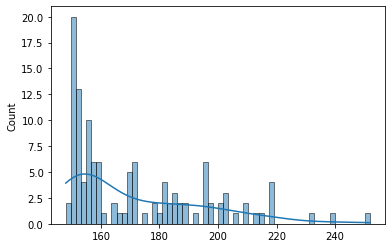

In [ ]:
sns.histplot(df_breed['breed'].value_counts().values, bins=60, kde=True)

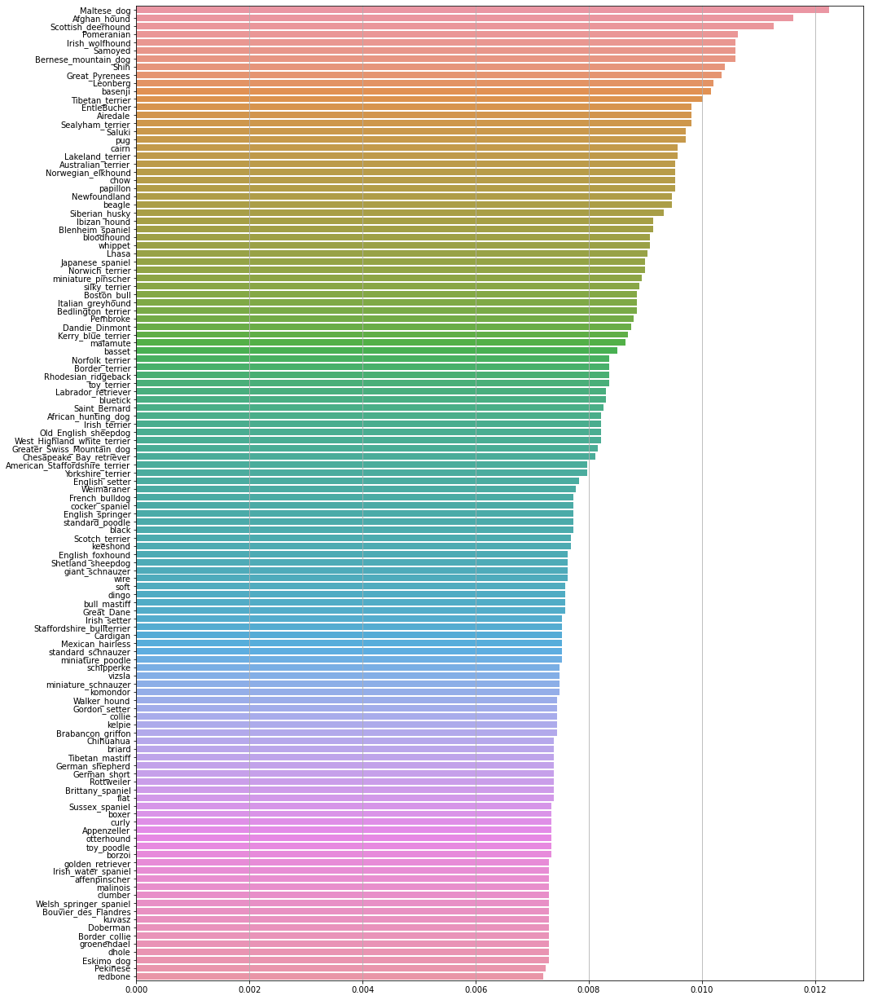

In [ ]:
plt.figure(figsize=(16,22))
sns.barplot(x=df_breed['breed'].value_counts(normalize=True).values, y=df_breed['breed'].value_counts(normalize=True).index)
plt.grid(axis='x')

## Exploration des images

Nous allons définir 2 fonctions utiles pour la suite de notre travail :

   1. la première pour charger une image avec la librairie *OpenCV* depuis un fichier
   2. la seconde pour afficher une ou plusieurs images à la fois

In [ ]:
def load_img(file, ext=['.png','.jpg','.jpeg','.JPG']):
    """
        Objectif : 
            charger une image avec la librairie OpenCV depuis un fichier image en local
        
        Arguments:
            file : chemin d'accès au fichier image à charger
            ext : liste des extensions de fichiers supportées
        
        Valeur retournée:
            img : objet image affichable
    """
    
    if file.endswith(tuple(ext)):
        img = cv2.imread(file, cv2.IMREAD_UNCHANGED)
        if len(img.shape) > 2:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        return img
    else:
        print("file extension unknown")

In [ ]:
def plot_imgs(imgs, titles=[]):
    """
        Objectif : 
            Afficher une ou plusieurs images à la fois
        
        Arguments:
            imgs : liste d'objets image
            titles : liste des titres associés aux objets image
        
        Valeur retournée:
            None : affiche la ou les images
    """
        
    if (len(imgs) == 1) or (type(imgs) not in [list,pd.core.series.Series]):
        img = imgs if type(imgs) is not list else imgs[0]
        title = None if len(titles) == 0 else (titles[0] if type(titles) is list else titles)
        plt.figure(figsize=(5,3))
        plt.suptitle(title, fontsize=15)
        if len(img.shape) > 2:
            plt.imshow(img)
        else:
            plt.imshow(img, cmap=plt.cm.binary)

    else:
        
        if len(imgs)%5 == 0:
            nrows = len(imgs)//5
            nb_cols_last_rows = 5
        else :
            nrows = len(imgs)//5 + 1
            nb_cols_last_rows = len(imgs)%5
        
        titles = None if len(titles) == 0 else (titles[0] if type(titles) is list and len(titles)==1 else titles)
        
        for i in range(nrows):
            if i != (nrows-1):
                fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(25,5))
            else:
                fig, axes = plt.subplots(nrows=1, ncols=nb_cols_last_rows, figsize=(5*nb_cols_last_rows,5))

            for j, img in enumerate(imgs[5*i:5*(i+1)]):
                ax = axes[j] if type(axes) == np.ndarray else axes
                if len(img.shape) > 2:
                    ax.imshow(img)
                else:
                    ax.imshow(img, cmap=plt.cm.binary)

                ax.set_title(titles[5*i+j], fontsize=18)
            
    plt.tight_layout()
    plt.show()

In [ ]:
img = load_img(df_breed['file_path'].sample(1)[0])

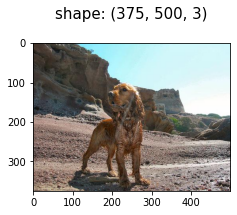

In [ ]:
plot_imgs(img, "shape: "+str(img.shape))

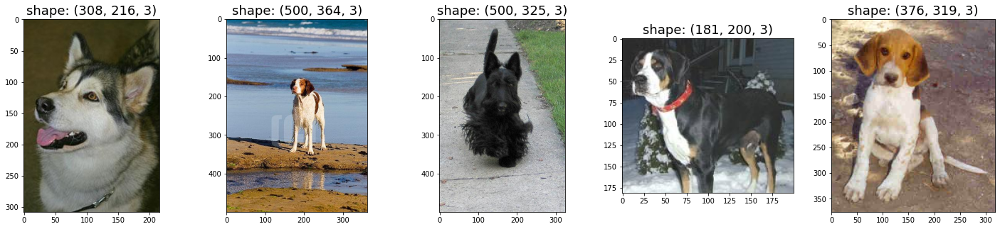

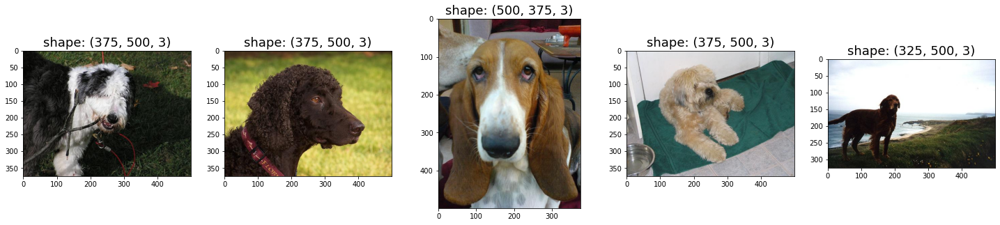

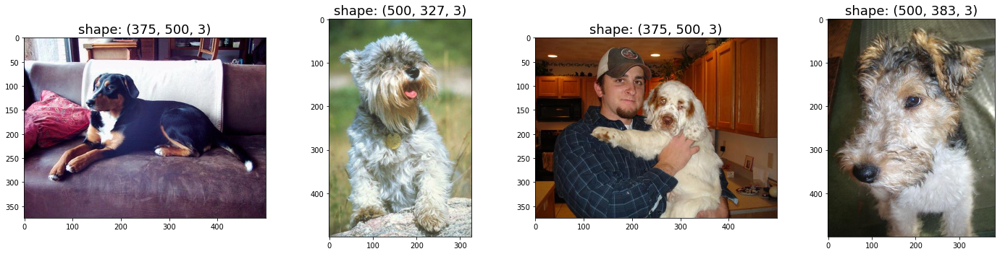

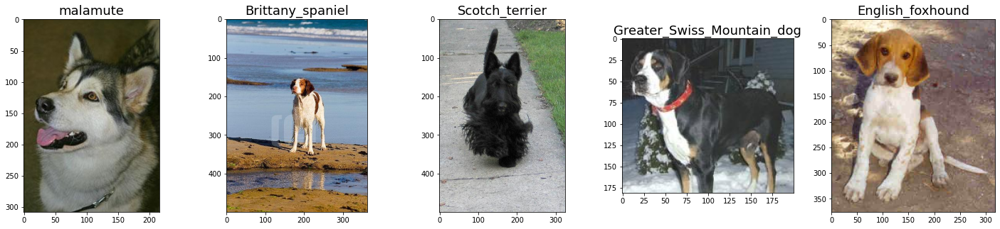

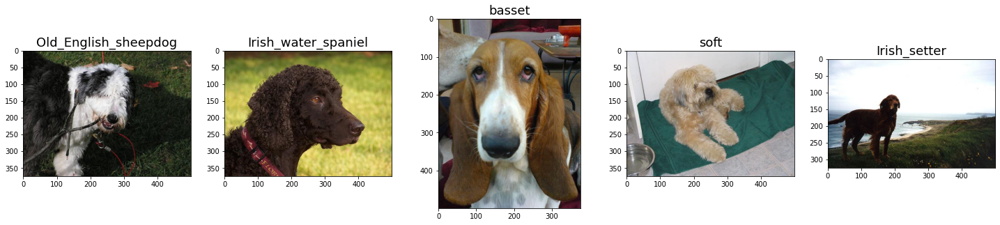

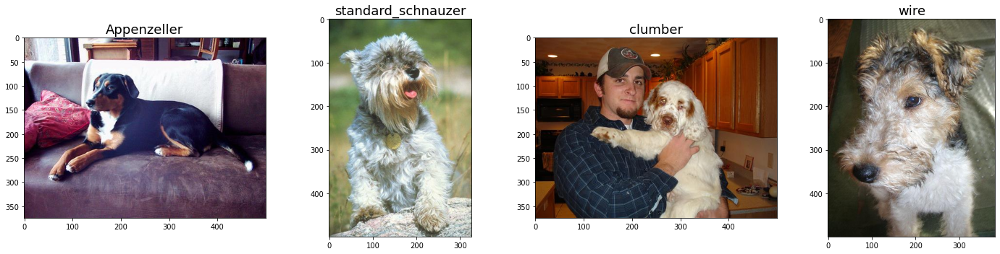

In [ ]:
samples = df_breed.sample(14)
imgs = [load_img(img_path) for img_path in samples['file_path'].values]
plot_imgs(imgs, titles=["shape: "+str(img.shape) for img in imgs])
plot_imgs(imgs, titles=samples['breed'].values)

Nous pouvons constater que les images sont de qualité similaire mais qu'elles diffèrent franchement en dimensions.
Nous aurons donc à les redimensionner.


## Limitations des ressources de calcul

Afin d'accélérer les temps de calcul nécessaire aux entraînement de nos modèles par la suite, nous allons limiter le nombre de races de chiens différentes dans notre jeu de données. Ainsi nous allons conserver **10 races de chiens**, tirées au hasard, et lorsque nous aurons defini un modèle optimal, nous l'entraînerons sur le jeu de données complet

In [ ]:
rng = np.random.default_rng()
list_10_breeds = rng.choice(df_breed['breed'].unique(), size=10, replace=False)
list_10_breeds

In [ ]:
load_pickle("list_10_breeds")

Variable créée sous le nom 'list_10_breeds' 


In [ ]:
df_10_breeds = df_breed[df_breed['breed'].isin(list_10_breeds)].sort_values(by="breed")
df_10_breeds

,file_name,file_path,breed
0,n02088094_713.jpg,datas/Images/n02088094-Afghan_hound/n02088094_...,Afghan_hound
0,n02088094_2641.jpg,datas/Images/n02088094-Afghan_hound/n02088094_...,Afghan_hound
0,n02088094_2700.jpg,datas/Images/n02088094-Afghan_hound/n02088094_...,Afghan_hound
0,n02088094_2559.jpg,datas/Images/n02088094-Afghan_hound/n02088094_...,Afghan_hound
0,n02088094_2726.jpg,datas/Images/n02088094-Afghan_hound/n02088094_...,Afghan_hound
...,...,...,...
0,n02099601_7993.jpg,datas/Images/n02099601-golden_retriever/n02099...,golden_retriever
0,n02099601_78.jpg,datas/Images/n02099601-golden_retriever/n02099...,golden_retriever
0,n02099601_9301.jpg,datas/Images/n02099601-golden_retriever/n02099...,golden_retriever
0,n02099601_7930.jpg,datas/Images/n02099601-golden_retriever/n02099...,golden_retriever


### Chargement des fichiers en image

In [ ]:
df_10_breeds["img"] = df_10_breeds['file_path'].apply(lambda x: load_img(x))

In [ ]:
# df_10_breeds.to_pickle("results/df_10_breeds.pkl")
df = pd.read_pickle("results/df_10_breeds.pkl")

### Équilibre du jeu de données

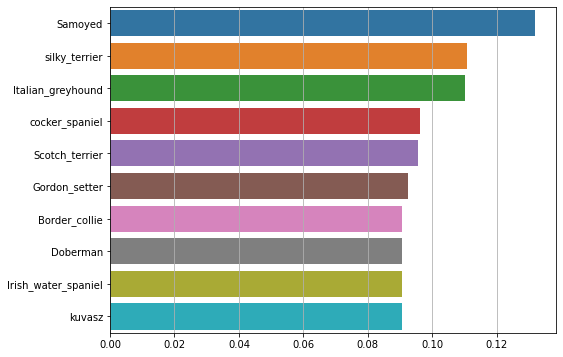

In [ ]:
plt.figure(figsize=(8,6))
sns.barplot(x=df['breed'].value_counts(normalize=True).values, y=df['breed'].value_counts(normalize=True).index)
plt.grid(axis='x')

Notre nouveau jeu de données est légèrement déséquilibré.
En tirant au hasard les races de chiens à conserver, c'est ce que nous cherchions, car nous allons entraîner un modèle qui sera amené à travailler sur un plus grand jeu de données, lui aussi déséquilibré.

## Redimensionnement des images

Pour entraîner nos modèles, il faut que toutes les images en entrée aient les mêmes dimensions.
Pour limiter la distorsion de celles-ci, nous allons d'abord observer la dispersion des dimensions des images de notre jeu.

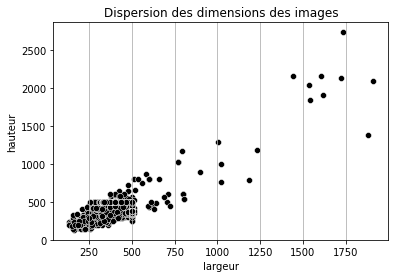

In [ ]:
width = [img.shape[0] for img in df["img"]]
height = [img.shape[1] for img in df["img"]]

fig, ax = plt.subplots(figsize=(6,4))

sns.scatterplot(x=width, y=height, color="black", ax=ax)
ax.set(xlabel='largeur', ylabel="hauteur", title="Dispersion des dimensions des images")
ax.grid(axis='x')

plt.show()

Il semble y avoir 2 frontières : pour **x = 500** et **y =500**, on zoome pour s'en assurer.

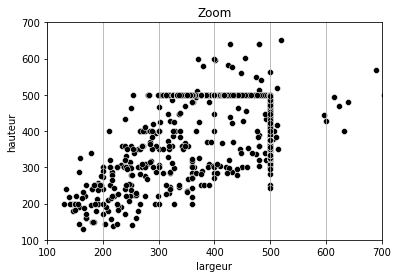

In [ ]:
fig, ax = plt.subplots(figsize=(6, 4))

sns.scatterplot(x=width, y=height, color="black", ax=ax)
ax.set(xlabel='largeur', ylabel="hauteur", xlim=[100,700], ylim=[100,700], title="Zoom")
ax.grid(axis='x')

plt.show()

Observation confirmée par ce zoom.
Vérifions le par le calcul :

In [ ]:
df['width'] = df['img'].apply(lambda x: x.shape[0])
df['heigth'] = df['img'].apply(lambda x: x.shape[1])

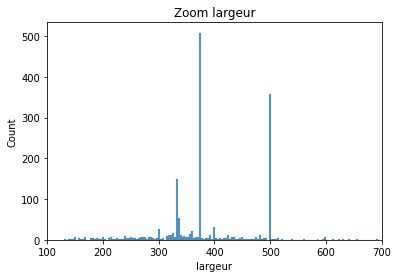

In [ ]:
fig, ax = plt.subplots(figsize=(6,4))

sns.histplot(df['width'], bins=500, ax=ax)
ax.set(xlabel='largeur', xlim=[100,700], title="Zoom largeur")

plt.show()

In [ ]:
df['width'].mode()

0    375
Name: width, dtype: int64

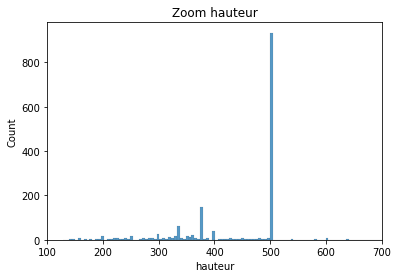

In [ ]:
fig, ax = plt.subplots(figsize=(6,4))

sns.histplot(df['heigth'], bins=500, ax=ax)
ax.set(xlabel='hauteur', xlim=[100,700], title="Zoom hauteur")

plt.show()

In [ ]:
df['heigth'].mode()

0    500
Name: heigth, dtype: int64

Nous choisissons donc de redimensionner toutes nos images vers les valeurs :  **500 * 500** (pour conserver des images carrées)

# Création des modèles et traitement des données avec TensorFlow & Keras

Pour la suite du projet nous allons utiliser la librairie **keras** de **tensorflow** qui intègre tous les outils nécessaires à la création de modèles de Deep Learning, ainsi qu'une panoplie de fonctions des images pour réaliser le prétraitement des images.

In [7]:
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

### Chargement des données dans les jeux d'entraînement et de validation

In [ ]:
batch_size = 32
img_height = 500
img_width = 500

data_dir = Path() / "datas" / "10_breeds"

train_ds = keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=SEED,
  image_size=(img_height, img_width),
  batch_size=batch_size)

val_ds = keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=SEED,
  image_size=(img_height, img_width),
  batch_size=batch_size)

class_names = train_ds.class_names
print(class_names)

num_classes = len(class_names)

Found 1745 files belonging to 10 classes.
Using 1396 files for training.
Found 1745 files belonging to 10 classes.
Using 349 files for validation.
['African_hunting_dog', 'Australian_terrier', 'Chesapeake_Bay_retriever', 'Irish_wolfhound', 'Rhodesian_ridgeback', 'Staffordshire_bullterrier', 'basset', 'bloodhound', 'schipperke', 'toy_poodle']


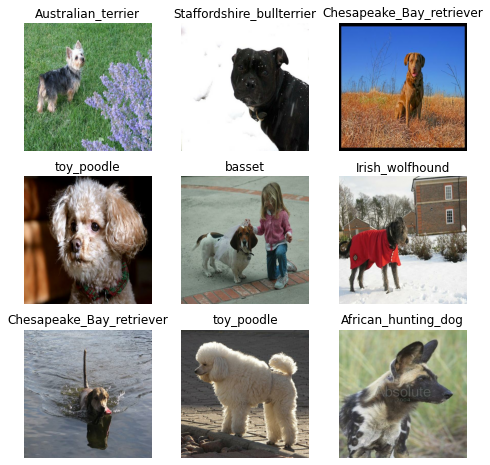

In [ ]:
plt.figure(figsize=(8, 8))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

In [ ]:
for image_batch, labels_batch in train_ds:
    print(image_batch.shape)
    print(labels_batch.shape)
    for image in image_batch:
        print(image.shape)
        break
    break

(32, 500, 500, 3)
(32,)
(500, 500, 3)


### Pré-traitement minimal

Dans un premiee temps nous allons juste mettre à l'échelle nos images en transposant la plage de valeurs de pixels de [0;255] à [0., 1.].

### Optimiser la lecture des jeux de données

Afin d'accélérer la lecture des données par notre modèle nous allons créer des jeux de données avec la méthode **prefetch** qui permet aux éléments ultérieurs d'être préparés pendant que l'élément actuel est en cours de traitement. 

Cela améliore souvent la latence et le débit, au prix de l'utilisation de mémoire supplémentaire pour stocker les éléments prérécupérés.

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [ ]:
for image, label in val_ds.take(1):
  batch_image = image
  batch_label = label
  break

In [ ]:
save_pickle(batch_image, "batch_image")
save_pickle(batch_label, "batch_label")

Fichier enregistré sous le nom 'batch_image' 
Fichier enregistré sous le nom 'batch_label' 


## Entraînement d'un modèle sommaire

Nous allons commencer par entraîner un réseau de neurones convolutionnels basique constitué de **3 couches de convolutions** toutes suivies d'une **couche de pooling max**, le tout se terminant par **2 couches denses** dont la dernière contient autant de cellules que de classes.

In [ ]:
model = Sequential([
    layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes)
])

model.compile(
  optimizer='adam',
  loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
  metrics=['accuracy'])

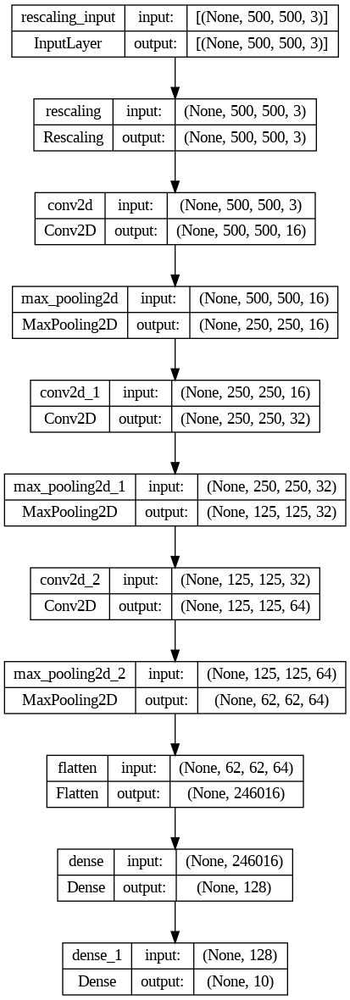

In [ ]:
keras.utils.plot_model(model, IMAGES_PATH/'first_model.png', show_shapes=True)

In [ ]:
n_epochs = 10

history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=n_epochs
)

Epoch 1/10
44/44 [==============================] - 2s 47ms/step - loss: 0.0023 - accuracy: 1.0000 - val_loss: 7.7697 - val_accuracy: 0.1862
Epoch 2/10
44/44 [==============================] - 2s 46ms/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 8.1191 - val_accuracy: 0.1834
Epoch 3/10
44/44 [==============================] - 2s 47ms/step - loss: 7.9569e-04 - accuracy: 1.0000 - val_loss: 8.3506 - val_accuracy: 0.1862
Epoch 4/10
44/44 [==============================] - 2s 47ms/step - loss: 5.4138e-04 - accuracy: 1.0000 - val_loss: 8.5452 - val_accuracy: 0.1862
Epoch 5/10
44/44 [==============================] - 2s 47ms/step - loss: 3.6520e-04 - accuracy: 1.0000 - val_loss: 8.7226 - val_accuracy: 0.1862
Epoch 6/10
44/44 [==============================] - 2s 47ms/step - loss: 2.7801e-04 - accuracy: 1.0000 - val_loss: 8.8462 - val_accuracy: 0.1920
Epoch 7/10
44/44 [==============================] - 2s 47ms/step - loss: 2.2097e-04 - accuracy: 1.0000 - val_loss: 8.9624 - val_accuracy: 

In [ ]:
def plot_learning_curves_from_history(history):

  acc = history.history['accuracy']
  val_acc = history.history['val_accuracy']

  loss = history.history['loss']
  val_loss = history.history['val_loss']

  epochs_range = range(history.params['epochs'])

  plt.figure(figsize=(12, 8))
  plt.subplot(2, 1, 1)
  plt.plot(epochs_range, acc, label='Training Accuracy')
  plt.plot(epochs_range, val_acc, label='Validation Accuracy')
  plt.legend(loc='lower right')
  plt.title('Training and Validation Accuracy')
  plt.grid(axis='both')

  plt.subplot(2, 1, 2)
  plt.plot(epochs_range, loss, label='Training Loss')
  plt.plot(epochs_range, val_loss, label='Validation Loss')
  plt.legend(loc='upper right')
  plt.title('Training and Validation Loss')
  plt.grid(axis='both')

  plt.show()

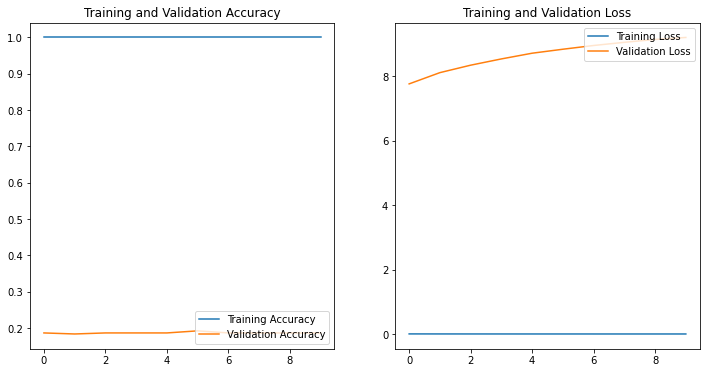

<Figure size 432x288 with 0 Axes>

In [ ]:
plot_learning_curves_from_history(history)
save_fig("Learning_curves_first_model")

Très clairement, notre modèle **surajuste les données d'entraînement**.

Étant donné que nous travaillons sur un petit nombre d'images, notre modèle peut apprendre des bruits ou des détails indésirables sur nos instances d'entraînement, à tel point que cela ait un impact négatif sur ses performances sur de nouveaux cas.

Pour enrayer ce problème nous pouvons essayer 3 méthodes : 
  - augmentation des données : générer de nouvelles images en transformant nos images d'entraînement pour augmenter le volume d'entraînement
  - *DropOut* : désactiver aléatoirement une fraction des neurones durant l'entrâinement pour ne pas faire évoluer tous les poids des connexions à chaque fois (le réseau devra donc développer une *meilleur vision d'ensemble* des informations transmises par ses neurones pour prendre les bonnes décisions, d'où une meilleure généralisation)
  - BatchNormalization : cette méthode consiste à centrer et réduire chaque batch d'image de sorte  à la sortie d'une couche de sorte que celle-ci voit toujours des données issues de la même distribution, accélérant ainsi la convergence des poids et ayant tendance à produire des modèles plus fiables

### Augmentation de données

Ici nous nous contenterons pour chaque image de générer une image, une image retournée horizontalement ou verticalement (aléatoirement) et une image tournée d'un angle compris dans la plage de valeur [-20% * 2pi, 20% * 2pi] .

In [ ]:
IMG_SIZE = 500

resize_and_rescale = tf.keras.Sequential([
  layers.Rescaling(1./255),
  layers.Resizing(IMG_SIZE, IMG_SIZE)
  
])

In [ ]:
data_augmentation = tf.keras.Sequential([
  layers.RandomFlip("horizontal_and_vertical"),
  layers.RandomRotation(0.2),
])

Observons les effets de notre couche d'augmentation des données sur une image :

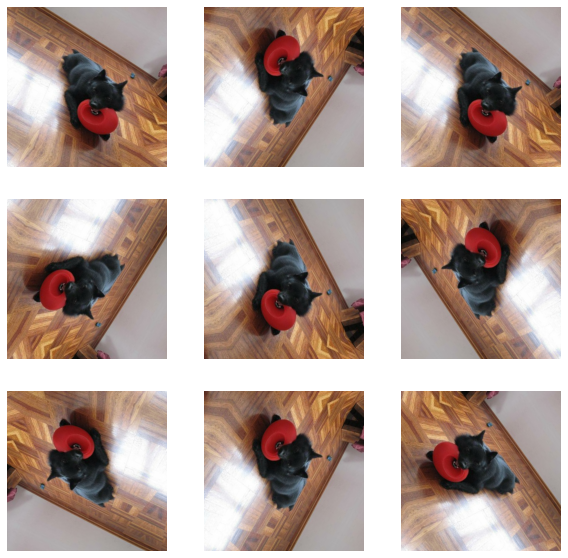

In [ ]:
for image, _ in train_ds.take(1):
  plt.figure(figsize=(10, 10))
  first_image = image[0]
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    augmented_image = data_augmentation(tf.expand_dims(first_image, 0))
    plt.imshow(augmented_image[0] / 255)
    plt.axis('off')
save_fig("Échantillons_générés_par_data_augmentation")

In [ ]:
n_epochs = 100

model_augmented = Sequential([
    resize_and_rescale,
    data_augmentation,
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes)
])

model_augmented.compile(
  optimizer='adam',
  loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
  metrics=['accuracy'])

history_augmented = model_augmented.fit(
  train_ds,
  validation_data=val_ds,
  epochs=n_epochs
)

Epoch 1/100


44/44 [==============================] - 8s 94ms/step - loss: 2.9514 - accuracy: 0.1189 - val_loss: 2.2423 - val_accuracy: 0.1662
Epoch 2/100
44/44 [==============================] - 4s 89ms/step - loss: 2.1468 - accuracy: 0.1999 - val_loss: 2.1231 - val_accuracy: 0.2378
Epoch 3/100
44/44 [==============================] - 4s 90ms/step - loss: 2.0273 - accuracy: 0.2715 - val_loss: 2.0520 - val_accuracy: 0.2636
Epoch 4/100
44/44 [==============================] - 4s 91ms/step - loss: 1.9360 - accuracy: 0.2801 - val_loss: 2.0177 - val_accuracy: 0.2579
Epoch 5/100
44/44 [==============================] - 4s 90ms/step - loss: 1.8934 - accuracy: 0.3166 - val_loss: 1.9965 - val_accuracy: 0.2607
Epoch 6/100
44/44 [==============================] - 4s 90ms/step - loss: 1.8320 - accuracy: 0.3460 - val_loss: 2.0071 - val_accuracy: 0.2607
Epoch 7/100
44/44 [==============================] - 4s 91ms/step - loss: 1.7819 - accuracy: 0.3532 - val_loss: 2.0213 - val_accuracy: 0.2607
Epoch 8/100
44/44 

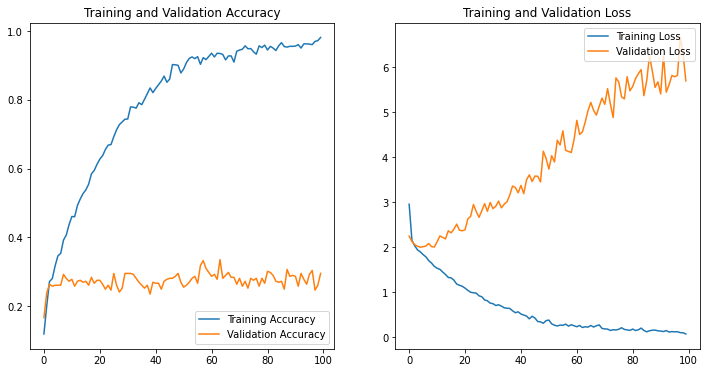

<Figure size 432x288 with 0 Axes>

In [ ]:
plot_learning_curves_from_history(history_augmented)
save_fig("Learning_curves_first_model_augmented")

Nous avons augmenter la performance de notre modèle sur le jeu de validation de **près de 50%** !

Essayons maintenant en rajoutant des couches de *DropOut* à la suite de nos couches denses :

In [ ]:
n_epochs=100

model_augmented_drop_out = Sequential([
    resize_and_rescale,
    data_augmentation,
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(num_classes)
])

model_augmented_drop_out.compile(
  optimizer='adam',
  loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
  metrics=['accuracy'])

history_augmented_drop_out = model_augmented_drop_out.fit(
  train_ds,
  validation_data=val_ds,
  epochs=n_epochs
)

Epoch 1/100


44/44 [==============================] - 14s 209ms/step - loss: 3.3682 - accuracy: 0.1003 - val_loss: 2.3025 - val_accuracy: 0.0831
Epoch 2/100
44/44 [==============================] - 9s 205ms/step - loss: 2.2990 - accuracy: 0.1082 - val_loss: 2.3431 - val_accuracy: 0.0946
Epoch 3/100
44/44 [==============================] - 9s 212ms/step - loss: 2.2846 - accuracy: 0.1397 - val_loss: 2.2484 - val_accuracy: 0.1547
Epoch 4/100
44/44 [==============================] - 10s 219ms/step - loss: 2.2363 - accuracy: 0.1655 - val_loss: 2.1730 - val_accuracy: 0.2149
Epoch 5/100
44/44 [==============================] - 9s 194ms/step - loss: 2.1853 - accuracy: 0.1784 - val_loss: 2.1336 - val_accuracy: 0.2579
Epoch 6/100
44/44 [==============================] - 10s 229ms/step - loss: 2.1596 - accuracy: 0.1999 - val_loss: 2.1248 - val_accuracy: 0.2865
Epoch 7/100
44/44 [==============================] - 9s 210ms/step - loss: 2.1261 - accuracy: 0.2192 - val_loss: 2.1788 - val_accuracy: 0.2321
Epoch 8/

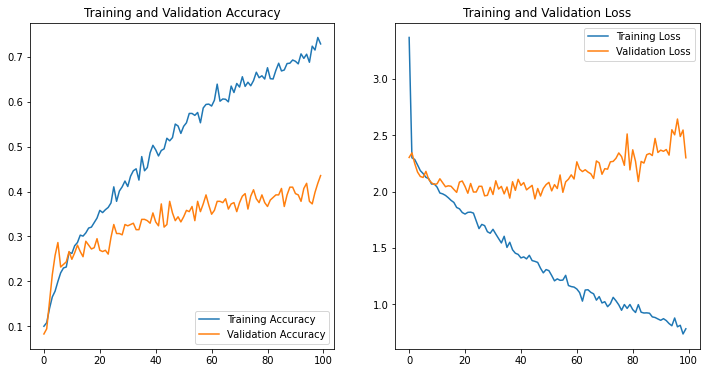

<Figure size 432x288 with 0 Axes>

In [ ]:
plot_learning_curves_from_history(history_augmented_drop_out)
save_fig("Learning_curves_first_model_augmented_drop_out")

Nous pouvons remarquer que nous n'améliorons pas globalement les performances de notre modèle sur le jeu de validation, comparativement au modèle sans *DropOut*, cependant nous diminuons le surajustement, et remarquons que le modèle apprend plus lentement avec le *DropOut*.

Essayons maintenant avec un couche de *BatchNormalization* avant les couches de calcul de notre modèle, pour voir si nous pouvons accélérer l'apprentissage du modèle et le rendre plus stable :

In [ ]:
n_epochs = 100

model_augmented_drop_out_b_norm = Sequential([
    resize_and_rescale,
    data_augmentation,
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.5),
    layers.Dense(num_classes)
])

model_augmented_drop_out_b_norm.compile(
  optimizer='adam',
  loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
  metrics=['accuracy'])

history_augmented_drop_out_b_norm = model_augmented_drop_out_b_norm.fit(
  train_ds,
  validation_data=val_ds,
  epochs=n_epochs
)

Epoch 1/100


44/44 [==============================] - 26s 310ms/step - loss: 3.3307 - accuracy: 0.1648 - val_loss: 2.5030 - val_accuracy: 0.1261
Epoch 2/100
44/44 [==============================] - 12s 283ms/step - loss: 2.5894 - accuracy: 0.2357 - val_loss: 2.4679 - val_accuracy: 0.1461
Epoch 3/100
44/44 [==============================] - 13s 288ms/step - loss: 2.3417 - accuracy: 0.2493 - val_loss: 2.4110 - val_accuracy: 0.1691
Epoch 4/100
44/44 [==============================] - 12s 268ms/step - loss: 2.2233 - accuracy: 0.2951 - val_loss: 2.4437 - val_accuracy: 0.0974
Epoch 5/100
44/44 [==============================] - 12s 272ms/step - loss: 2.0627 - accuracy: 0.3052 - val_loss: 2.2760 - val_accuracy: 0.1691
Epoch 6/100
44/44 [==============================] - 12s 264ms/step - loss: 1.9857 - accuracy: 0.3245 - val_loss: 2.2677 - val_accuracy: 0.1977
Epoch 7/100
44/44 [==============================] - 11s 259ms/step - loss: 1.8478 - accuracy: 0.3782 - val_loss: 2.2455 - val_accuracy: 0.2092
Epoc

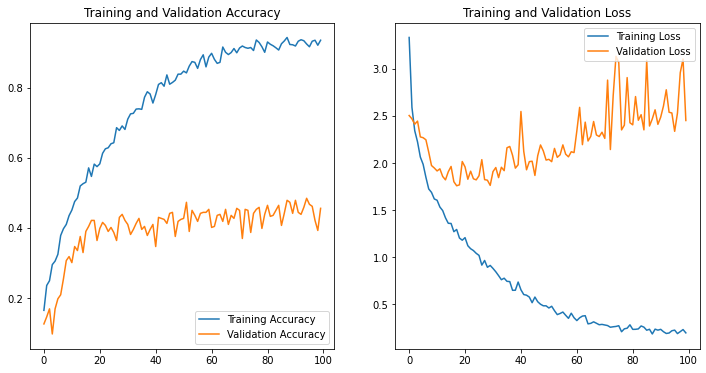

<Figure size 432x288 with 0 Axes>

In [ ]:
plot_learning_curves_from_history(history_augmented_drop_out_b_norm)
save_fig("Learning_curves_first_model_augmented_drop_out_b_norm")

Nous améliorons légèrement les performances de notre modèle sur le jeu de validation globalement, cependant il devient **beaucoup plus instable** et converge plus lentement vers son plateau.

Avant de tenter d'enrayer ce problème de stabilité, nous allons voir si nous pouvons améliorer les performances de notre modèles en doublant le nombre de couches convolutionnelles, puis nous ajusterons certains éléments de l'architecture de notre modèle et règlerons finement un certain nombre d'hyperparamètres.

Il est courant de doubler le nombre de filtres (donc de cartes caractéristiques) à chaque nouvelle couche de convolution car chaque couche de maxpooling divise par 2 chaque dimension spatiale dans notre cas : nous n'augmentons ainsi pas le nombre de paramètres, l'empreinte mémoire ou la charge de calcul liés à chaque nouvelle couche.

In [ ]:
n_epochs = 50

model_augmented_drop_out_b_norm_double_conv = Sequential([
    resize_and_rescale,
    data_augmentation,
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Conv2D(128, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Conv2D(256, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Conv2D(512, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(256, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.5),
    layers.Dense(num_classes)
])

model_augmented_drop_out_b_norm_double_conv.compile(
  optimizer='adam',
  loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
  metrics=['accuracy'])

history_augmented_drop_out_b_norm_double_conv = model_augmented_drop_out_b_norm_double_conv.fit(
  train_ds,
  validation_data=val_ds,
  epochs=n_epochs
)

Epoch 1/50


44/44 [==============================] - 34s 541ms/step - loss: 3.1246 - accuracy: 0.1741 - val_loss: 2.9314 - val_accuracy: 0.0745
Epoch 2/50
44/44 [==============================] - 20s 459ms/step - loss: 2.5492 - accuracy: 0.2407 - val_loss: 2.7853 - val_accuracy: 0.1032
Epoch 3/50
44/44 [==============================] - 20s 454ms/step - loss: 2.2745 - accuracy: 0.2980 - val_loss: 3.0697 - val_accuracy: 0.0745
Epoch 4/50
44/44 [==============================] - 20s 464ms/step - loss: 2.1669 - accuracy: 0.3080 - val_loss: 2.7588 - val_accuracy: 0.1175
Epoch 5/50
44/44 [==============================] - 20s 460ms/step - loss: 2.0390 - accuracy: 0.3567 - val_loss: 3.0767 - val_accuracy: 0.1117
Epoch 6/50
44/44 [==============================] - 20s 465ms/step - loss: 1.9250 - accuracy: 0.3875 - val_loss: 2.4360 - val_accuracy: 0.2292
Epoch 7/50
44/44 [==============================] - 20s 461ms/step - loss: 1.8168 - accuracy: 0.4047 - val_loss: 2.8630 - val_accuracy: 0.1146
Epoch 8/50

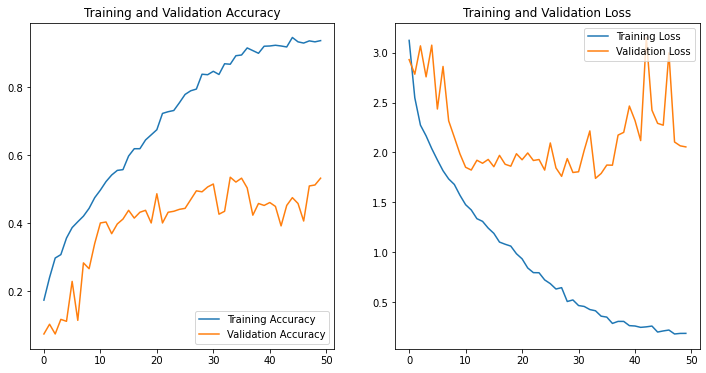

<Figure size 432x288 with 0 Axes>

In [ ]:
plot_learning_curves_from_history(history_augmented_drop_out_b_norm_double_conv)
save_fig("Learning_curves_first_model_augmented_drop_out_b_norm_double_conv")

Notre modèle est capable de bien meilleurs performances, mais il reste instable quand bien même il atteint son plateau plus rapidement que notre modèle précédent avec 2 fois moins de couches de convolutions.

Regardons maintenant s'il nous est possible de rendre notre modèle plus stable en diminuant la proportion de neurones éteints lors de l'entraînement.


In [ ]:
n_epochs = 50

model_augmented_drop_out_red_b_norm_double_conv = Sequential([
    resize_and_rescale,
    data_augmentation,
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Conv2D(128, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Conv2D(256, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Conv2D(512, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(256, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.2),
    layers.Dense(num_classes)
])

model_augmented_drop_out_red_b_norm_double_conv.compile(
  optimizer='adam',
  loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
  metrics=['accuracy'])

history_augmented_drop_out_red_b_norm_double_conv = model_augmented_drop_out_red_b_norm_double_conv.fit(
  train_ds,
  validation_data=val_ds,
  epochs=n_epochs
)

Epoch 1/50


44/44 [==============================] - 27s 468ms/step - loss: 2.7006 - accuracy: 0.2120 - val_loss: 4.9297 - val_accuracy: 0.0745
Epoch 2/50
44/44 [==============================] - 20s 457ms/step - loss: 2.0421 - accuracy: 0.3009 - val_loss: 4.5431 - val_accuracy: 0.0745
Epoch 3/50
44/44 [==============================] - 21s 478ms/step - loss: 1.8577 - accuracy: 0.3739 - val_loss: 3.5023 - val_accuracy: 0.1003
Epoch 4/50
44/44 [==============================] - 20s 458ms/step - loss: 1.7545 - accuracy: 0.3933 - val_loss: 4.0844 - val_accuracy: 0.0974
Epoch 5/50
44/44 [==============================] - 21s 469ms/step - loss: 1.6601 - accuracy: 0.4255 - val_loss: 4.6138 - val_accuracy: 0.0917
Epoch 6/50
44/44 [==============================] - 20s 461ms/step - loss: 1.5330 - accuracy: 0.4628 - val_loss: 3.4389 - val_accuracy: 0.1089
Epoch 7/50
44/44 [==============================] - 21s 470ms/step - loss: 1.4618 - accuracy: 0.4950 - val_loss: 3.0306 - val_accuracy: 0.1203
Epoch 8/50

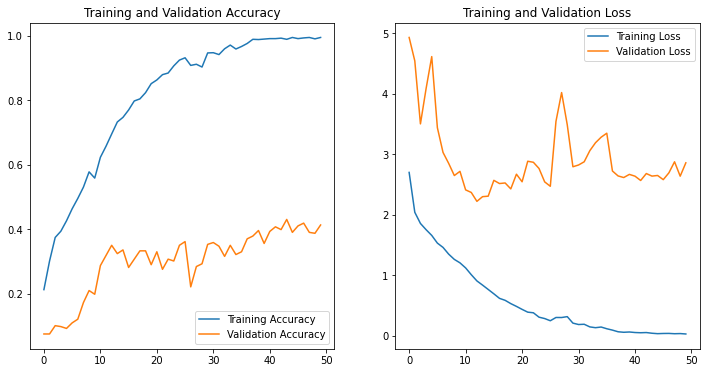

<Figure size 432x288 with 0 Axes>

In [ ]:
plot_learning_curves_from_history(history_augmented_drop_out_red_b_norm_double_conv)
save_fig("Learning_curves_first_model_augmented_drop_out_red_b_norm_double_conv")

Le modèle est moins performant, mais légèrement moins instable.

Essayons avec un plus grande fraction de neurones éteints lors du *DropOut* :

In [ ]:
n_epochs = 50

model_augmented_drop_out_aug_b_norm_double_conv = Sequential([
    resize_and_rescale,
    data_augmentation,
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Conv2D(128, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Conv2D(256, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Conv2D(512, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(256, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.7),
    layers.Dense(num_classes)
])

model_augmented_drop_out_aug_b_norm_double_conv.compile(
  optimizer='adam',
  loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
  metrics=['accuracy'])

history_augmented_drop_out_aug_b_norm_double_conv = model_augmented_drop_out_aug_b_norm_double_conv.fit(
  train_ds,
  validation_data=val_ds,
  epochs=n_epochs
)

Epoch 1/50


44/44 [==============================] - 27s 470ms/step - loss: 3.7158 - accuracy: 0.1533 - val_loss: 3.7891 - val_accuracy: 0.0745
Epoch 2/50
44/44 [==============================] - 21s 478ms/step - loss: 3.1458 - accuracy: 0.1884 - val_loss: 5.9452 - val_accuracy: 0.0745
Epoch 3/50
44/44 [==============================] - 20s 454ms/step - loss: 2.7733 - accuracy: 0.2414 - val_loss: 4.4528 - val_accuracy: 0.1060
Epoch 4/50
44/44 [==============================] - 20s 463ms/step - loss: 2.6137 - accuracy: 0.2679 - val_loss: 3.2104 - val_accuracy: 0.1032
Epoch 5/50
44/44 [==============================] - 20s 457ms/step - loss: 2.4800 - accuracy: 0.3016 - val_loss: 3.4552 - val_accuracy: 0.0745
Epoch 6/50
44/44 [==============================] - 20s 466ms/step - loss: 2.3600 - accuracy: 0.3145 - val_loss: 2.7397 - val_accuracy: 0.1347
Epoch 7/50
44/44 [==============================] - 20s 464ms/step - loss: 2.1850 - accuracy: 0.3281 - val_loss: 2.8824 - val_accuracy: 0.1777
Epoch 8/50

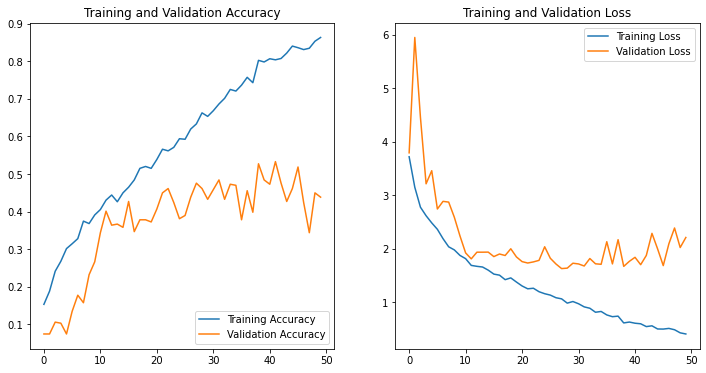

<Figure size 432x288 with 0 Axes>

In [ ]:
plot_learning_curves_from_history(history_augmented_drop_out_aug_b_norm_double_conv)
save_fig("Learning_curves_first_model_augmented_drop_out_aug_b_norm_double_conv")

Nous observons qu'avec un taux de *DropOut* élevé, notre est un peu plus performant et le taux de perte se stabilise à un niveau plus faible qu'avec un taux réduit.

Nous allons maintenant doubler chaque couche de convolution, ajouter une couche dense avant la couche de sortie et supprimer la *BatchNormalization* qui semble dans notre cas être à l'origine de l'instabilité de nos modèles.

En particulier, nous allons augmenter la taille du filtre de la première couche de convolution avec un pas de 2 : cela permet de diminuer la dimension spatial des images sans perdre trop d'informations.

In [ ]:
n_epochs = 150

model_augmented_drop_out_b_norm_full = Sequential([
    resize_and_rescale,
    data_augmentation,
    layers.Conv2D(16, 7, strides=(2,2), padding='same', activation='relu'),
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Conv2D(128, 3, padding='same', activation='relu'),
    layers.Conv2D(128, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Conv2D(256, 3, padding='same', activation='relu'),
    layers.Conv2D(256, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Conv2D(512, 3, padding='same', activation='relu'),
    layers.Conv2D(512, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(256, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.5),
    layers.Dense(128, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.5),
    layers.Dense(num_classes)
])

model_augmented_drop_out_b_norm_full.compile(
  optimizer='adam',
  loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
  metrics=['accuracy'])

history_augmented_drop_out_b_norm_full = model_augmented_drop_out_b_norm_full.fit(
  train_ds,
  validation_data=val_ds,
  epochs=n_epochs
)

Epoch 1/150


44/44 [==============================] - 23s 328ms/step - loss: 3.2695 - accuracy: 0.1168 - val_loss: 6.2444 - val_accuracy: 0.1146
Epoch 2/150
44/44 [==============================] - 14s 323ms/step - loss: 3.0035 - accuracy: 0.1304 - val_loss: 2.7178 - val_accuracy: 0.1089
Epoch 3/150
44/44 [==============================] - 14s 324ms/step - loss: 2.7900 - accuracy: 0.1490 - val_loss: 2.6569 - val_accuracy: 0.1117
Epoch 4/150
44/44 [==============================] - 15s 347ms/step - loss: 2.6842 - accuracy: 0.1669 - val_loss: 2.8447 - val_accuracy: 0.1003
Epoch 5/150
44/44 [==============================] - 14s 321ms/step - loss: 2.6318 - accuracy: 0.1784 - val_loss: 2.4928 - val_accuracy: 0.1117
Epoch 6/150
44/44 [==============================] - 14s 320ms/step - loss: 2.5271 - accuracy: 0.1934 - val_loss: 2.3691 - val_accuracy: 0.1662
Epoch 7/150
44/44 [==============================] - 15s 331ms/step - loss: 2.4362 - accuracy: 0.1905 - val_loss: 2.3563 - val_accuracy: 0.1719
Epoc

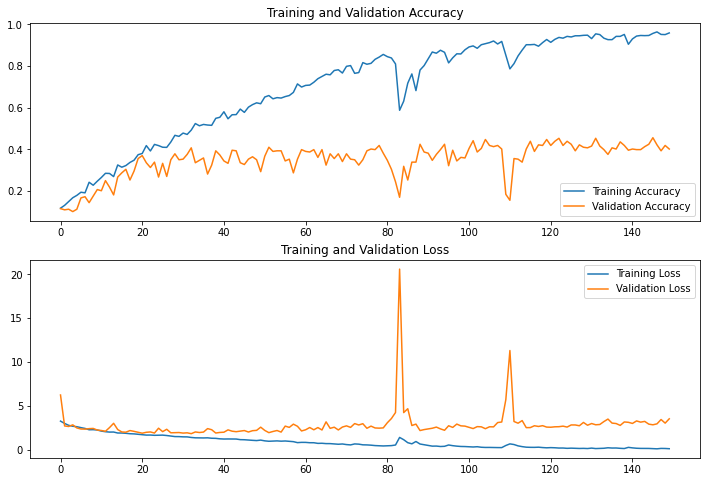

<Figure size 432x288 with 0 Axes>

In [ ]:
plot_learning_curves_from_history(history_augmented_drop_out_b_norm_full)
save_fig("Learning_curves_first_model_augmented_drop_out_b_norm_full")

Doubler chaque couche de convolution a l'air de rendre notre modèle plus stable globalement, mais ne permet pas d'améliorer les performances.

Essayons maintenant en réduisant le nombre d'ensembles de couches :

In [ ]:
n_epochs = 50

model_augmented_drop_out_b_norm_full_red = Sequential([
    resize_and_rescale,
    data_augmentation,
    layers.Conv2D(16, 7, strides=(2,2), padding='same', activation='relu'),
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Conv2D(128, 3, padding='same', activation='relu'),
    layers.Conv2D(128, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(256, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.5),
    layers.Dense(128, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.5),
    layers.Dense(num_classes)
])

model_augmented_drop_out_b_norm_full_red.compile(
  optimizer='adam',
  loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
  metrics=['accuracy'])

history_augmented_drop_out_b_norm_full_red = model_augmented_drop_out_b_norm_full_red.fit(
  train_ds,
  validation_data=val_ds,
  epochs=n_epochs
)

Epoch 1/50


44/44 [==============================] - 61s 307ms/step - loss: 3.3478 - accuracy: 0.1318 - val_loss: 3.1162 - val_accuracy: 0.1003
Epoch 2/50
44/44 [==============================] - 12s 283ms/step - loss: 3.0668 - accuracy: 0.1411 - val_loss: 2.5061 - val_accuracy: 0.1175
Epoch 3/50
44/44 [==============================] - 13s 285ms/step - loss: 2.8737 - accuracy: 0.1626 - val_loss: 2.5127 - val_accuracy: 0.1117
Epoch 4/50
44/44 [==============================] - 13s 287ms/step - loss: 2.6998 - accuracy: 0.1698 - val_loss: 2.8660 - val_accuracy: 0.1060
Epoch 5/50
44/44 [==============================] - 13s 286ms/step - loss: 2.6025 - accuracy: 0.1891 - val_loss: 2.5824 - val_accuracy: 0.1261
Epoch 6/50
44/44 [==============================] - 13s 287ms/step - loss: 2.4699 - accuracy: 0.1991 - val_loss: 2.4556 - val_accuracy: 0.1519
Epoch 7/50
44/44 [==============================] - 13s 290ms/step - loss: 2.3426 - accuracy: 0.2271 - val_loss: 2.3976 - val_accuracy: 0.1490
Epoch 8/50

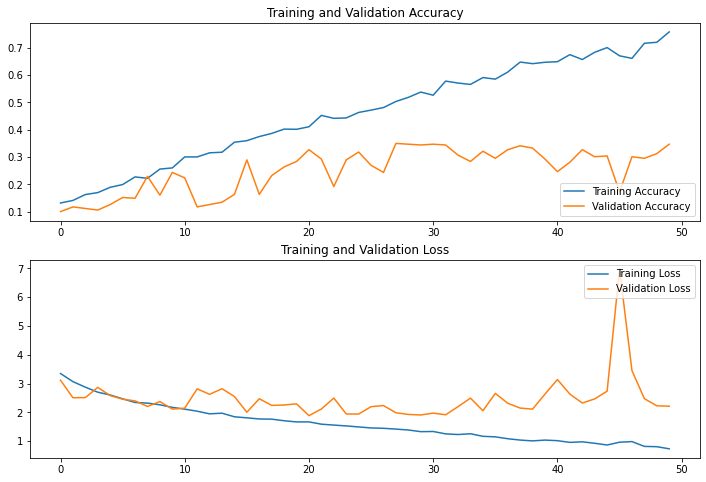

<Figure size 432x288 with 0 Axes>

In [ ]:
plot_learning_curves_from_history(history_augmented_drop_out_b_norm_full_red)
save_fig("Learning_curves_first_model_augmented_drop_out_b_norm_full_red")

Nous notons juste une baisse de performance du modèle.

Essayons avec le modèle entier avec un *DropOut* élevé (qui nous avait offert les meilleurs performances sur le modèle réduit) : 

In [ ]:
n_epochs = 50

model_augmented_drop_out_aug_b_norm_full = Sequential([
    resize_and_rescale,
    data_augmentation,
    layers.Conv2D(16, 7, strides=(2,2), padding='same', activation='relu'),
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Conv2D(128, 3, padding='same', activation='relu'),
    layers.Conv2D(128, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Conv2D(256, 3, padding='same', activation='relu'),
    layers.Conv2D(256, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Conv2D(512, 3, padding='same', activation='relu'),
    layers.Conv2D(512, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(256, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.7),
    layers.Dense(128, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.7),
    layers.Dense(num_classes)
])

model_augmented_drop_out_aug_b_norm_full.compile(
  optimizer='adam',
  loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
  metrics=['accuracy'])

history_augmented_drop_out_aug_b_norm_full = model_augmented_drop_out_aug_b_norm_full.fit(
  train_ds,
  validation_data=val_ds,
  epochs=n_epochs
)

Epoch 1/50


44/44 [==============================] - 23s 321ms/step - loss: 4.1027 - accuracy: 0.1060 - val_loss: 2.4996 - val_accuracy: 0.0974
Epoch 2/50
44/44 [==============================] - 14s 313ms/step - loss: 3.7466 - accuracy: 0.1067 - val_loss: 2.6974 - val_accuracy: 0.1375
Epoch 3/50
44/44 [==============================] - 14s 315ms/step - loss: 3.3799 - accuracy: 0.1304 - val_loss: 3.1153 - val_accuracy: 0.1261
Epoch 4/50
44/44 [==============================] - 14s 317ms/step - loss: 3.0660 - accuracy: 0.1504 - val_loss: 3.1844 - val_accuracy: 0.1318
Epoch 5/50
44/44 [==============================] - 14s 319ms/step - loss: 2.9720 - accuracy: 0.1590 - val_loss: 2.9195 - val_accuracy: 0.1060
Epoch 6/50
44/44 [==============================] - 14s 318ms/step - loss: 2.8283 - accuracy: 0.1719 - val_loss: 2.7640 - val_accuracy: 0.1375
Epoch 7/50
44/44 [==============================] - 14s 320ms/step - loss: 2.7045 - accuracy: 0.1726 - val_loss: 2.3827 - val_accuracy: 0.2235
Epoch 8/50

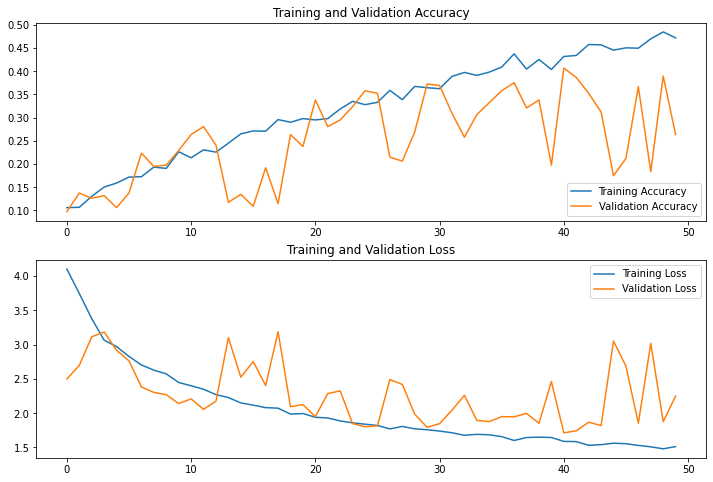

<Figure size 432x288 with 0 Axes>

In [ ]:
plot_learning_curves_from_history(history_augmented_drop_out_aug_b_norm_full)
save_fig("Learning_curves_first_model_augmented_drop_out_aug_b_norm_full")

Le modèle est moins performant et beaucoup plus instable dans cette configuration, essayons avec un taux de *DropOut* faible :

In [ ]:
n_epochs = 50

model_augmented_drop_out_red_b_norm_full = Sequential([
    resize_and_rescale,
    data_augmentation,
    layers.Conv2D(16, 7, strides=(2,2), padding='same', activation='relu'),
    layers.Conv2D(16, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Conv2D(128, 3, padding='same', activation='relu'),
    layers.Conv2D(128, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Conv2D(256, 3, padding='same', activation='relu'),
    layers.Conv2D(256, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Conv2D(512, 3, padding='same', activation='relu'),
    layers.Conv2D(512, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(256, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.2),
    layers.Dense(128, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.2),
    layers.Dense(num_classes)
])

model_augmented_drop_out_red_b_norm_full.compile(
  optimizer='adam',
  loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
  metrics=['accuracy'])

history_augmented_drop_out_red_b_norm_full = model_augmented_drop_out_red_b_norm_full.fit(
  train_ds,
  validation_data=val_ds,
  epochs=n_epochs
)

Epoch 1/50


44/44 [==============================] - 24s 327ms/step - loss: 2.8417 - accuracy: 0.1562 - val_loss: 3.5304 - val_accuracy: 0.1003
Epoch 2/50
44/44 [==============================] - 14s 315ms/step - loss: 2.4969 - accuracy: 0.1805 - val_loss: 3.9016 - val_accuracy: 0.1203
Epoch 3/50
44/44 [==============================] - 14s 318ms/step - loss: 2.3055 - accuracy: 0.2199 - val_loss: 2.9455 - val_accuracy: 0.1146
Epoch 4/50
44/44 [==============================] - 14s 319ms/step - loss: 2.1943 - accuracy: 0.2342 - val_loss: 2.8175 - val_accuracy: 0.1117
Epoch 5/50
44/44 [==============================] - 14s 318ms/step - loss: 2.1301 - accuracy: 0.2622 - val_loss: 2.4820 - val_accuracy: 0.1232
Epoch 6/50
44/44 [==============================] - 14s 320ms/step - loss: 2.0413 - accuracy: 0.3044 - val_loss: 2.5944 - val_accuracy: 0.1289
Epoch 7/50
44/44 [==============================] - 14s 318ms/step - loss: 1.8923 - accuracy: 0.3410 - val_loss: 2.6131 - val_accuracy: 0.1375
Epoch 8/50

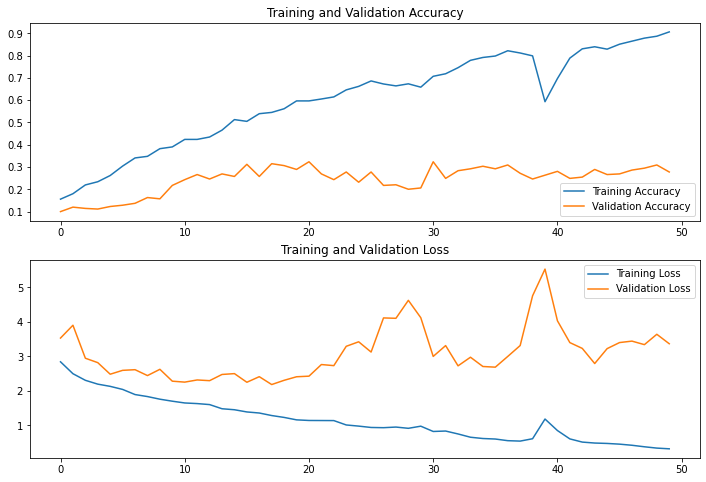

<Figure size 432x288 with 0 Axes>

In [ ]:
plot_learning_curves_from_history(history_augmented_drop_out_red_b_norm_full)
save_fig("Learning_curves_first_model_augmented_drop_out_red_b_norm_full")

Notre modèle avec double couche de convolution n'a pas de meilleures performances visiblement, nous allons revenir sur notre meilleur modèle jusqu'à présent et l'entraîner sans *BatchNormalization*, en conservant un filtre plus grand dans la couche de convolution en entrée, et ajoutnant une couche dense avant la couche de sortie du réseau :

In [ ]:
n_epochs = 50

model_augmented_drop_out_double_conv = Sequential([
    resize_and_rescale,
    data_augmentation,
    layers.Conv2D(16, 7, strides=(2,2), padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(128, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(256, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(512, 3, padding='same', activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(num_classes)
])

model_augmented_drop_out_double_conv.compile(
  optimizer='adam',
  loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
  metrics=['accuracy'])

history_augmented_drop_out_double_conv = model_augmented_drop_out_double_conv.fit(
  train_ds,
  validation_data=val_ds,
  epochs=n_epochs
)

Epoch 1/50


44/44 [==============================] - 13s 157ms/step - loss: 2.3058 - accuracy: 0.1182 - val_loss: 2.2994 - val_accuracy: 0.1261
Epoch 2/50
44/44 [==============================] - 8s 171ms/step - loss: 2.3000 - accuracy: 0.1110 - val_loss: 2.3001 - val_accuracy: 0.1261
Epoch 3/50
44/44 [==============================] - 7s 165ms/step - loss: 2.2984 - accuracy: 0.1275 - val_loss: 2.2999 - val_accuracy: 0.1261
Epoch 4/50
44/44 [==============================] - 7s 153ms/step - loss: 2.2981 - accuracy: 0.1211 - val_loss: 2.3003 - val_accuracy: 0.1261
Epoch 5/50
44/44 [==============================] - 8s 180ms/step - loss: 2.2983 - accuracy: 0.1189 - val_loss: 2.3002 - val_accuracy: 0.1261
Epoch 6/50
44/44 [==============================] - 6s 146ms/step - loss: 2.2987 - accuracy: 0.1254 - val_loss: 2.3002 - val_accuracy: 0.1261
Epoch 7/50
44/44 [==============================] - 8s 173ms/step - loss: 2.2963 - accuracy: 0.1196 - val_loss: 2.3008 - val_accuracy: 0.1261
Epoch 8/50
44/44

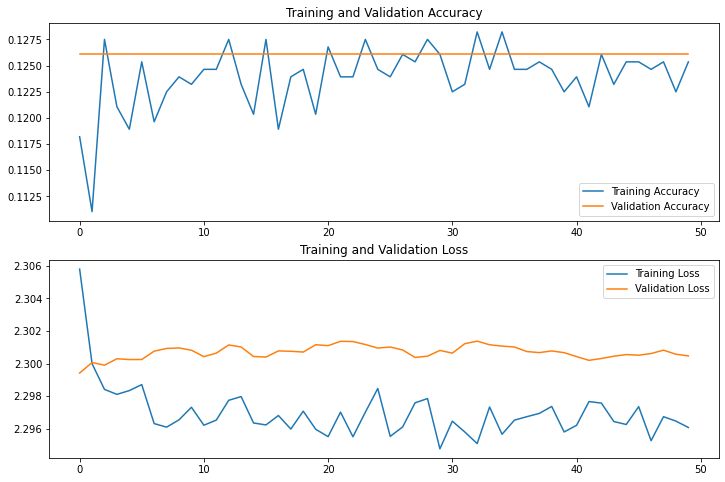

<Figure size 432x288 with 0 Axes>

In [ ]:
plot_learning_curves_from_history(history_augmented_drop_out_double_conv)
save_fig("Learning_curves_first_model_augmented_drop_out_double_conv")

In [ ]:
n_epochs = 100

model_augmented_drop_out_b_norm_incr_layers = Sequential([
    resize_and_rescale,
    data_augmentation,
    layers.Conv2D(16, 7, strides=(2,2), padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.5),
    layers.Dense(256, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.5),
    layers.Dense(num_classes)
])

model_augmented_drop_out_b_norm_incr_layers.compile(
  optimizer='adam',
  loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
  metrics=['accuracy'])

history_augmented_drop_out_b_norm_incr_layers = model_augmented_drop_out_b_norm_incr_layers.fit(
  train_ds,
  validation_data=val_ds,
  epochs=n_epochs
)

Epoch 1/100


44/44 [==============================] - 16s 187ms/step - loss: 3.3258 - accuracy: 0.1225 - val_loss: 2.3385 - val_accuracy: 0.1318
Epoch 2/100
44/44 [==============================] - 9s 202ms/step - loss: 2.9425 - accuracy: 0.1626 - val_loss: 2.5068 - val_accuracy: 0.1633
Epoch 3/100
44/44 [==============================] - 9s 198ms/step - loss: 2.7250 - accuracy: 0.1769 - val_loss: 2.5845 - val_accuracy: 0.1089
Epoch 4/100
44/44 [==============================] - 8s 179ms/step - loss: 2.5589 - accuracy: 0.1984 - val_loss: 2.6045 - val_accuracy: 0.1175
Epoch 5/100
44/44 [==============================] - 9s 200ms/step - loss: 2.4559 - accuracy: 0.2092 - val_loss: 2.6067 - val_accuracy: 0.1117
Epoch 6/100
44/44 [==============================] - 9s 201ms/step - loss: 2.3173 - accuracy: 0.2450 - val_loss: 2.6418 - val_accuracy: 0.1232
Epoch 7/100
44/44 [==============================] - 8s 180ms/step - loss: 2.2650 - accuracy: 0.2679 - val_loss: 2.2729 - val_accuracy: 0.1948
Epoch 8/10

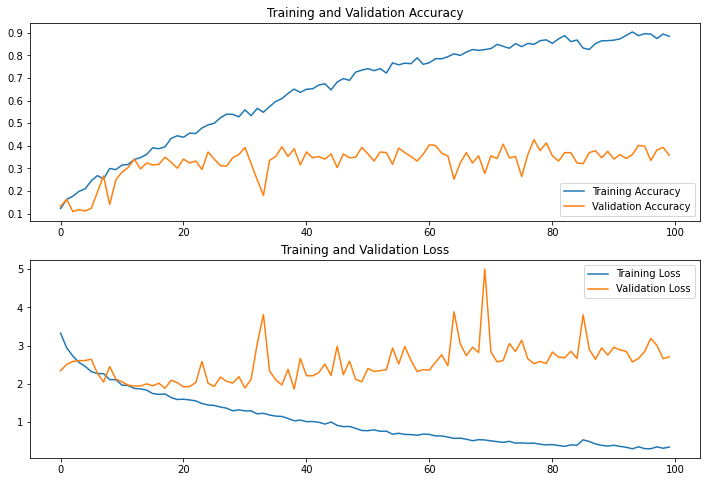

<Figure size 432x288 with 0 Axes>

In [ ]:
plot_learning_curves_from_history(history_augmented_drop_out_b_norm_incr_layers)
save_fig("Learning_curves_first_model_augmented_drop_out_b_norm_incr_layers")

In [ ]:
n_epochs = 100

model_augmented_drop_out_b_norm_incr_layers_2 = Sequential([
    resize_and_rescale,
    data_augmentation,
    layers.Conv2D(16, 7, strides=(2,2), padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Conv2D(128, 3, padding='same', activation='relu'),
    layers.Conv2D(128, 3, padding='same', activation='relu'),
    layers.Conv2D(128, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dropout(0.5),
    layers.Dense(128, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.5),
    layers.Dense(256, activation='relu'),
    layers.BatchNormalization(),
    layers.Dense(num_classes)
])

model_augmented_drop_out_b_norm_incr_layers_2.compile(
  optimizer='adam',
  loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
  metrics=['accuracy'])

history_augmented_drop_out_b_norm_incr_layers_2 = model_augmented_drop_out_b_norm_incr_layers_2.fit(
  train_ds,
  validation_data=val_ds,
  epochs=n_epochs
)

Epoch 1/100


44/44 [==============================] - 20s 242ms/step - loss: 2.6628 - accuracy: 0.1626 - val_loss: 2.4556 - val_accuracy: 0.1433
Epoch 2/100
44/44 [==============================] - 9s 216ms/step - loss: 2.3341 - accuracy: 0.2042 - val_loss: 2.7010 - val_accuracy: 0.1261
Epoch 3/100
44/44 [==============================] - 9s 202ms/step - loss: 2.2066 - accuracy: 0.2328 - val_loss: 2.9314 - val_accuracy: 0.1089
Epoch 4/100
44/44 [==============================] - 9s 211ms/step - loss: 2.0993 - accuracy: 0.2736 - val_loss: 2.7300 - val_accuracy: 0.1605
Epoch 5/100
44/44 [==============================] - 9s 210ms/step - loss: 2.0768 - accuracy: 0.2593 - val_loss: 2.7856 - val_accuracy: 0.1318
Epoch 6/100
44/44 [==============================] - 8s 191ms/step - loss: 2.0107 - accuracy: 0.2865 - val_loss: 2.6222 - val_accuracy: 0.1547
Epoch 7/100
44/44 [==============================] - 9s 213ms/step - loss: 1.9860 - accuracy: 0.3001 - val_loss: 2.5017 - val_accuracy: 0.2178
Epoch 8/10

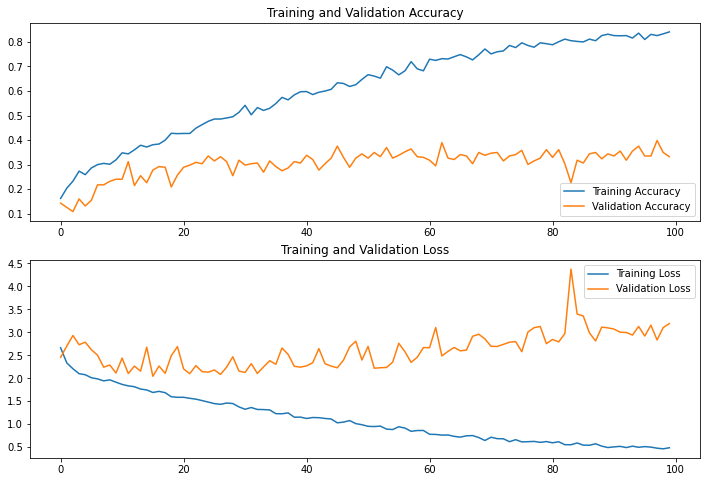

<Figure size 432x288 with 0 Axes>

In [ ]:
plot_learning_curves_from_history(history_augmented_drop_out_b_norm_incr_layers_2)
save_fig("Learning_curves_first_model_augmented_drop_out_b_norm_incr_layers_2")

In [ ]:
n_epochs = 150

model_augmented_drop_out_b_norm_incr_layers_3 = Sequential([
    resize_and_rescale,
    data_augmentation,
    layers.Conv2D(16, 7, strides=(2,2), padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Conv2D(128, 3, padding='same', activation='relu'),
    layers.Conv2D(128, 3, padding='same', activation='relu'),
    layers.Conv2D(128, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dropout(0.5),
    layers.Dense(128, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.5),
    layers.Dense(256, activation='relu'),
    layers.Dense(num_classes)
])

model_augmented_drop_out_b_norm_incr_layers_3.compile(
  optimizer='adam',
  loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
  metrics=['accuracy'])

history_augmented_drop_out_b_norm_incr_layers_3 = model_augmented_drop_out_b_norm_incr_layers_3.fit(
  train_ds,
  validation_data=val_ds,
  epochs=n_epochs
)

Epoch 1/150


44/44 [==============================] - 17s 223ms/step - loss: 2.5376 - accuracy: 0.1418 - val_loss: 2.4823 - val_accuracy: 0.1318
Epoch 2/150
44/44 [==============================] - 9s 215ms/step - loss: 2.2765 - accuracy: 0.1920 - val_loss: 3.5613 - val_accuracy: 0.1203
Epoch 3/150
44/44 [==============================] - 9s 194ms/step - loss: 2.2068 - accuracy: 0.2163 - val_loss: 3.1248 - val_accuracy: 0.1203
Epoch 4/150
44/44 [==============================] - 10s 220ms/step - loss: 2.0894 - accuracy: 0.2572 - val_loss: 3.1329 - val_accuracy: 0.1203
Epoch 5/150
44/44 [==============================] - 9s 214ms/step - loss: 2.0618 - accuracy: 0.2808 - val_loss: 2.6442 - val_accuracy: 0.1461
Epoch 6/150
44/44 [==============================] - 8s 192ms/step - loss: 1.9995 - accuracy: 0.2872 - val_loss: 2.8489 - val_accuracy: 0.1605
Epoch 7/150
44/44 [==============================] - 10s 228ms/step - loss: 1.9793 - accuracy: 0.3037 - val_loss: 2.4760 - val_accuracy: 0.1977
Epoch 8/

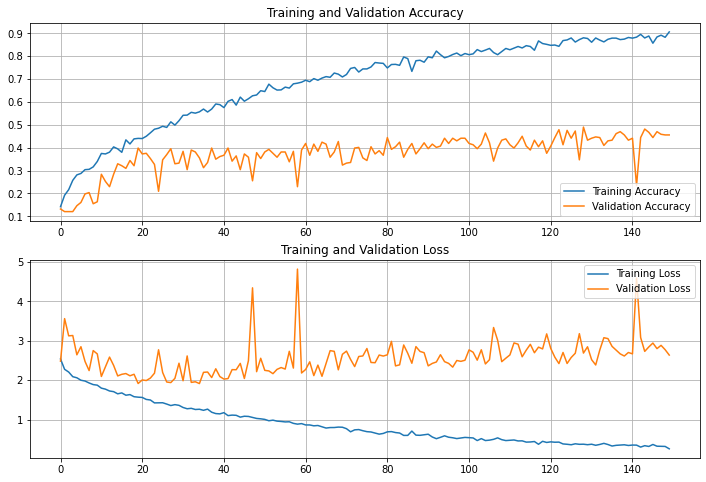

<Figure size 432x288 with 0 Axes>

In [ ]:
plot_learning_curves_from_history(history_augmented_drop_out_b_norm_incr_layers_3)
save_fig("Learning_curves_first_model_augmented_drop_out_b_norm_incr_layers_3")

Notre modèle semble continué à apprendre continuellement, essayons de prolonger l'entraînement pour s'en assurer.

In [ ]:
n_epochs = 250

model_augmented_drop_out_b_norm_incr_layers_3_long_training = Sequential([
    resize_and_rescale,
    data_augmentation,
    layers.Conv2D(16, 7, strides=(2,2), padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.Conv2D(32, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.Conv2D(64, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Conv2D(128, 3, padding='same', activation='relu'),
    layers.Conv2D(128, 3, padding='same', activation='relu'),
    layers.Conv2D(128, 3, padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dropout(0.5),
    layers.Dense(128, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.5),
    layers.Dense(256, activation='relu'),
    layers.Dense(num_classes)
])

model_augmented_drop_out_b_norm_incr_layers_3_long_training.compile(
  optimizer='adam',
  loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
  metrics=['accuracy'])

history_augmented_drop_out_b_norm_incr_layers_3_long_training = model_augmented_drop_out_b_norm_incr_layers_3_long_training.fit(
  train_ds,
  validation_data=val_ds,
  epochs=n_epochs
)

Epoch 1/250


44/44 [==============================] - 17s 226ms/step - loss: 2.5441 - accuracy: 0.1397 - val_loss: 2.5898 - val_accuracy: 0.1003
Epoch 2/250
44/44 [==============================] - 10s 230ms/step - loss: 2.3209 - accuracy: 0.1870 - val_loss: 2.4523 - val_accuracy: 0.0888
Epoch 3/250
44/44 [==============================] - 9s 199ms/step - loss: 2.1703 - accuracy: 0.2206 - val_loss: 2.6947 - val_accuracy: 0.1347
Epoch 4/250
44/44 [==============================] - 9s 203ms/step - loss: 2.0631 - accuracy: 0.2672 - val_loss: 2.4602 - val_accuracy: 0.1146
Epoch 5/250
44/44 [==============================] - 10s 220ms/step - loss: 1.9887 - accuracy: 0.2930 - val_loss: 2.5675 - val_accuracy: 0.1146
Epoch 6/250
44/44 [==============================] - 9s 213ms/step - loss: 1.9430 - accuracy: 0.3080 - val_loss: 2.7839 - val_accuracy: 0.1203
Epoch 7/250
44/44 [==============================] - 9s 213ms/step - loss: 1.8780 - accuracy: 0.3145 - val_loss: 2.8329 - val_accuracy: 0.1347
Epoch 8/

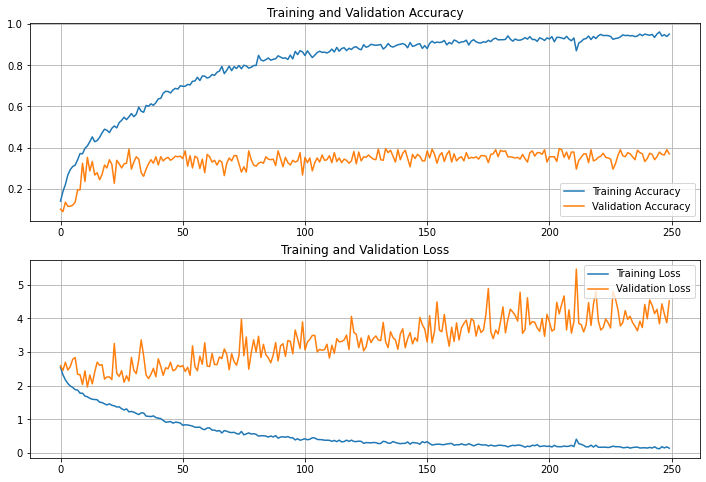

<Figure size 432x288 with 0 Axes>

In [ ]:
plot_learning_curves_from_history(history_augmented_drop_out_b_norm_incr_layers_3_long_training)
save_fig("Learning_curves_first_model_augmented_drop_out_b_norm_incr_layers_3_long_training")

Étrangement, nous n'avons même pas dépassé la valeur de 0.4 d'**Accuracy** sur un nombre d'entraînement pourtant **près de 70%** plus grand.

Nous attribuons cette différence au caractère aléatoire de l'initialisation des poids du réseau.


Nous allons maintenant partir de l'architecture suivante et nous définirons ensuite un ensemble d'hyperparamètres que nous allons optimiser via **GridSearCV**.

## Optimisation des hyperparamètres

Nous allons procéder de manière hiérarchique en ajustant d'abord la taille des batchs, ainsi que le nombre d'epochs, puis nous chercherons à définir le meilleure algorithme d'optimisation de la fonction objective de notre modèle.

Ensuite nous chercherons à optimiser le learning rate et le momentum, 2 paramètres influant sur la trajectoire d'optimisation de la fonction objective.

Puis nous poursuivrons avec toutes les autres hyperparamètres dont les plages de valeurs à explorer sont définies ci-dessous : 

In [ ]:
!pip install keras-tuner --upgrade

In [ ]:
import keras_tuner
from keras import backend

In [ ]:
hp = keras_tuner.HyperParameters()

# Volume des batchs et nombre d'entraînements
batch_size = hp.Int("batch_size", 32, 128, 32)
epochs = hp.Int("epochs", 30, 150, 20)

# Algorithme d'optimisation
optimizer = hp.Choice("optimizer", ['sgd', 'rmsprop', 'adagrad', 'adadelta', 'adam', 'adamax', 'nadam', 'ftrl'])

# Taux d'apprentissage 
learning_rate: hp.Choice('learning_rate', [0.0001, 0.001, 0.1])

# Mode d'initialisation des poids du réseau
kernel_init = hp.Choice('kernel_init', ['random_uniform', 'random_normal', 'glorot_normal', 'glorot_uniform', 'he_normal', 'he_uniform', 'truncatedNormal'])

# Fonction d'activation des neurones
activation = hp.Choice('activation', ['softmax', 'softplus', 'softsign', 'relu', 'tanh', 'sigmoid', 'elu', 'selu', 'exponential'])

# Taux de désactivation des neurones des couches denses cachées durant l'entraînement
dropout_rate = hp.Float('dropout_rate', 0, 0.9, 0.1)

# Taille de l'image
img_size = hp.Int("img_size", 100, 700, 200)

### Création d'une fonction de génération de notre modèle

Nous allons définir une fonction prenant en argument les hyper-paramètres que nous souhaitons ajuster, qui l'entraîne, l'évalue et retourne son score **Accuracy**.

Ainsi, nous pourrons appeler cette fonction pour chaque différente valeur des hyperparamètres à ajuster, en fixant ceux déjà déterminés au fur-et-à-mesure de notre démarche, sans avoir à ré-écrire de code.

In [ ]:
def build_fit_eval_model(batch_size=32, 
                         epochs=50, 
                         optimizer='adam',
                         learning_rate=0.001,
                         kernel_init="glorot_uniform",
                         activation='relu',
                         dropout_rate=0.5,
                         img_size=500
):

  # Preparing the data
  train_ds = keras.utils.image_dataset_from_directory(
                                                      data_dir,
                                                      validation_split=0.2,
                                                      subset="training",
                                                      seed=SEED,
                                                      image_size=(img_size,img_size),
                                                      batch_size=batch_size
                                                      )
  
  val_ds = keras.utils.image_dataset_from_directory(
                                                    data_dir,
                                                    validation_split=0.2,
                                                    subset="validation",
                                                    seed=SEED,
                                                    image_size=(img_size,img_size),
                                                    batch_size=batch_size
                                                    )
  
  num_classes = len(train_ds.class_names)

  # Optimizing data usability
  AUTOTUNE = tf.data.AUTOTUNE

  train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
  val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

  # Building the model
  model_to_optimize = Sequential([
      resize_and_rescale,
      data_augmentation,
      layers.Conv2D(16, 7, strides=(2,2), padding='same', activation=activation),
      layers.BatchNormalization(),
      layers.MaxPooling2D(),
      layers.Conv2D(32, 3, padding='same', activation=activation, kernel_initializer=kernel_init),
      layers.Conv2D(32, 3, padding='same', activation=activation),
      layers.BatchNormalization(),
      layers.MaxPooling2D(),
      layers.Conv2D(64, 3, padding='same', activation=activation),
      layers.Conv2D(64, 3, padding='same', activation=activation),
      layers.Conv2D(64, 3, padding='same', activation=activation),
      layers.BatchNormalization(),
      layers.MaxPooling2D(),
      layers.Conv2D(128, 3, padding='same', activation=activation),
      layers.Conv2D(128, 3, padding='same', activation=activation),
      layers.Conv2D(128, 3, padding='same', activation=activation),
      layers.BatchNormalization(),
      layers.MaxPooling2D(),
      layers.Flatten(),
      layers.Dropout(dropout_rate),
      layers.Dense(128, activation=activation),
      layers.BatchNormalization(),
      layers.Dropout(dropout_rate),
      layers.Dense(256, activation=activation),
      layers.Dense(10)
  ])

  model_to_optimize.compile(loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True), 
                            optimizer=optimizer, 
                            metrics=['accuracy']
                            )
  
  backend.set_value(model_to_optimize.optimizer.learning_rate, learning_rate)

  # Fitting the model
  model_to_optimize.fit(train_ds,
                        epochs=epochs,
                        batch_size=batch_size
                       )

  accuracy = model_to_optimize.evaluate(val_ds,
                                        batch_size=batch_size
                                       )


  return accuracy

Grâce à cette fonction et aux hyperparamètres définis avant, nous allons pouvoir créer une classe qui nous permettra d'instancier notre fonction avec les hyperparamètres à ajuster à chaque fois, ou la valeur de ceux déjà déterminés dans les étapes précédentes :

In [ ]:
MODEL_TUNING_PATH = Path() / "results" / "model_tuning"
MODEL_TUNING_PATH.mkdir(parents=True, exist_ok=True)

class batch_size_epochs_tuning(keras_tuner.GridSearch):
  def run_trial(self, trial, **kwargs):
    hp = trial.hyperparameters
    return build_fit_eval_model(batch_size=hp.Int("batch_size", 32, 128, 32), 
                                epochs=hp.Int("epochs", 30, 150, 20))

In [ ]:
batch_size_epochs_tuning = batch_size_epochs_tuning(overwrite=True, directory="results", project_name="model_tuning")

In [ ]:
batch_size_epochs_tuning.search(callbacks=[keras.callbacks.TensorBoard("/results/tb_logs")])

Trial 10 Complete [00h 13m 37s]
default_objective: 1.9841833412647247

Best default_objective So Far: 1.1922337412834167
Total elapsed time: 01h 20m 51s


In [ ]:
%load_ext tensorboard

%tensorboard --logdir /results/tb_logs

In [ ]:
best_batch_size_epochs_hps = batch_size_epochs_tuning.get_best_hyperparameters()[0]
best_batch_size_epochs_hps.values

{'batch_size': 32, 'epochs': 30}

In [ ]:
batch_size_epochs_tuning.results_summary()

Results summary
Results in results/model_tuning
Showing 10 best trials
Trial summary
Hyperparameters:
batch_size: 32
epochs: 30
Score: 1.1922337412834167
Trial summary
Hyperparameters:
batch_size: 128
epochs: 50
Score: 1.3006864339113235
Trial summary
Hyperparameters:
batch_size: 32
epochs: 50
Score: 1.4054180532693863
Trial summary
Hyperparameters:
batch_size: 64
epochs: 110
Score: 1.509071245789528
Trial summary
Hyperparameters:
batch_size: 128
epochs: 70
Score: 1.6927807033061981
Trial summary
Hyperparameters:
batch_size: 32
epochs: 150
Score: 1.730115607380867
Trial summary
Hyperparameters:
batch_size: 96
epochs: 50
Score: 1.7453838884830475
Trial summary
Hyperparameters:
batch_size: 96
epochs: 150
Score: 1.9841833412647247
Trial summary
Hyperparameters:
batch_size: 96
epochs: 110
Score: 2.121391534805298
Trial summary
Hyperparameters:
batch_size: 128
epochs: 150
Score: 2.2375984638929367


In [ ]:
load_pickle("best_batch_size_epochs_hps")
# save_pickle(batch_size_epochs_tuning.results_summary(), "batch_size_epochs_search_summary")

Variable créée sous le nom 'best_batch_size_epochs_hps' 


In [ ]:
class optimizer_tuning(keras_tuner.GridSearch):
  def run_trial(self, trial, **kwargs):
    hp = trial.hyperparameters
    return build_fit_eval_model(**best_batch_size_epochs_hps.values,
                                optimizer=hp.Choice("optimizer", ['sgd', 'rmsprop', 'adagrad', 'adadelta', 'adam', 'adamax', 'nadam', 'ftrl'])
                                )

In [ ]:
optimizer_tuning = optimizer_tuning(overwrite=True, directory="results", project_name="model_tuning")

In [ ]:
optimizer_tuning.search(callbacks=[keras.callbacks.TensorBoard("/results/tb_logs")])

Trial 8 Complete [00h 02m 04s]
default_objective: 1.2096827737987041

Best default_objective So Far: 1.0892316550016403
Total elapsed time: 00h 16m 41s


In [ ]:
%load_ext tensorboard

%tensorboard --logdir /results/tb_logs

In [ ]:
best_optimizer_tuning_hps = optimizer_tuning.get_best_hyperparameters()[0]
best_optimizer_tuning_hps.values

{'optimizer': 'adagrad'}

In [ ]:
optimizer_search_summary = optimizer_tuning.results_summary()
optimizer_search_summary

Results summary
Results in results/model_tuning
Showing 10 best trials
Trial summary
Hyperparameters:
optimizer: adagrad
Score: 1.0892316550016403
Trial summary
Hyperparameters:
optimizer: sgd
Score: 1.1306883543729782
Trial summary
Hyperparameters:
optimizer: adamax
Score: 1.185129538178444
Trial summary
Hyperparameters:
optimizer: ftrl
Score: 1.2096827737987041
Trial summary
Hyperparameters:
optimizer: adadelta
Score: 1.238901924341917
Trial summary
Hyperparameters:
optimizer: rmsprop
Score: 1.262848049402237
Trial summary
Hyperparameters:
optimizer: adam
Score: 1.27417454123497
Trial summary
Hyperparameters:
optimizer: nadam
Score: 1.3620667904615402


In [ ]:
load_pickle("best_optimizer_tuning_hps")
# save_pickle(optimizer_search_summary, "optimizer_search_summary")

Variable créée sous le nom 'best_optimizer_tuning_hps' 


In [ ]:
class learning_rate_tuning(keras_tuner.GridSearch):
  def run_trial(self, trial, **kwargs):
    hp = trial.hyperparameters
    return build_fit_eval_model(**best_batch_size_epochs_hps.values,
                                **best_optimizer_tuning_hps.values,
                                learning_rate=hp.Choice('learning_rate', [0.0001, 0.001, 0.1])
                                )

In [ ]:
learning_rate_tuning_model = learning_rate_tuning(overwrite=True, directory="results", project_name="model_tuning")

In [ ]:
learning_rate_tuning_model.search(callbacks=[keras.callbacks.TensorBoard("/results/tb_logs")])

Trial 3 Complete [00h 02m 05s]
default_objective: 1.1503020375967026

Best default_objective So Far: 1.1457201391458511
Total elapsed time: 00h 06m 13s


In [ ]:
best_learning_rate_tuning_hps = learning_rate_tuning_model.get_best_hyperparameters()[0]
best_learning_rate_tuning_hps.values

{'learning_rate': 0.001}

In [ ]:
learning_rate_search_summary = learning_rate_tuning_model.results_summary()
learning_rate_search_summary

Results summary
Results in results/model_tuning
Showing 10 best trials
Trial summary
Hyperparameters:
learning_rate: 0.001
Score: 1.1457201391458511
Trial summary
Hyperparameters:
learning_rate: 0.1
Score: 1.1503020375967026
Trial summary
Hyperparameters:
learning_rate: 0.0001
Score: 1.2104141935706139


In [ ]:
load_pickle("best_learning_rate_tuning_hps")
# save_pickle(learning_rate_search_summary, "learning_rate_search_summary")

Variable créée sous le nom 'best_learning_rate_tuning_hps' 


In [ ]:
class kernel_init_tuning(keras_tuner.GridSearch):
  def run_trial(self, trial, **kwargs):
    hp = trial.hyperparameters
    return build_fit_eval_model(**best_batch_size_epochs_hps.values,
                                **best_optimizer_tuning_hps.values,
                                **best_learning_rate_tuning_hps.values,
                                kernel_init=hp.Choice('kernel_init', ['random_uniform', 'random_normal', 'glorot_normal', 'glorot_uniform', 'he_normal', 'he_uniform', 'truncatedNormal'])
                                )



In [ ]:
kernel_init_tuning_model = kernel_init_tuning(overwrite=True, directory="results", project_name="model_tuning")

In [ ]:
kernel_init_tuning_model.search(callbacks=[keras.callbacks.TensorBoard("/results/tb_logs")])

Trial 7 Complete [00h 00m 01s]

Best default_objective So Far: 1.102771908044815
Total elapsed time: 00h 12m 21s


In [ ]:
best_kernel_init_tuning_model_hps = kernel_init_tuning_model.get_best_hyperparameters()[0]
best_kernel_init_tuning_model_hps.values

{'kernel_init': 'random_normal'}

In [ ]:
kernel_init_search_summary = kernel_init_tuning_model.results_summary()
kernel_init_search_summary

Results summary
Results in results/model_tuning
Showing 10 best trials
Trial summary
Hyperparameters:
kernel_init: random_normal
Score: 1.102771908044815
Trial summary
Hyperparameters:
kernel_init: glorot_normal
Score: 1.117658019065857
Trial summary
Hyperparameters:
kernel_init: random_uniform
Score: 1.1409355700016022
Trial summary
Hyperparameters:
kernel_init: glorot_uniform
Score: 1.1563953757286072
Trial summary
Hyperparameters:
kernel_init: he_normal
Score: 1.1642877012491226
Trial summary
Hyperparameters:
kernel_init: he_uniform
Score: 1.1819843351840973


In [ ]:
load_pickle("best_kernel_init_tuning_model_hps")
# save_pickle(kernel_init_search_summary, "kernel_init_search_summary")

Variable créée sous le nom 'best_kernel_init_tuning_model_hps' 


In [ ]:
class activation_tuning(keras_tuner.GridSearch):
  def run_trial(self, trial, **kwargs):
    hp = trial.hyperparameters
    return build_fit_eval_model(**best_batch_size_epochs_hps.values,
                                **best_optimizer_tuning_hps.values,
                                **best_learning_rate_tuning_hps.values,
                                **best_kernel_init_tuning_model_hps.values,
                                activation=hp.Choice('activation', ['softmax', 'softplus', 'softsign', 'relu', 'tanh', 'sigmoid', 'elu', 'selu', 'exponential'])
                                )

In [ ]:
activation_tuning_model = activation_tuning(overwrite=True, directory="results", project_name="model_tuning")

In [ ]:
activation_tuning_model.search(callbacks=[keras.callbacks.TensorBoard("/results/tb_logs")])

Trial 9 Complete [00h 03m 48s]
default_objective: nan

Best default_objective So Far: 1.1257163286209106
Total elapsed time: 00h 39m 24s


In [ ]:
best_activation_tuning_model_hps = activation_tuning_model.get_best_hyperparameters()[0]
best_activation_tuning_model_hps.values

{'activation': 'tanh'}

In [ ]:
activation_search_summary = activation_tuning_model.results_summary()
activation_search_summary

Results summary
Results in results/model_tuning
Showing 10 best trials
Trial summary
Hyperparameters:
activation: tanh
Score: 1.1257163286209106
Trial summary
Hyperparameters:
activation: selu
Score: 1.1295067816972733
Trial summary
Hyperparameters:
activation: relu
Score: 1.149038702249527
Trial summary
Hyperparameters:
activation: softplus
Score: 1.1604623049497604
Trial summary
Hyperparameters:
activation: sigmoid
Score: 1.1629393547773361
Trial summary
Hyperparameters:
activation: elu
Score: 1.1673105657100677
Trial summary
Hyperparameters:
activation: softsign
Score: 1.1753971576690674
Trial summary
Hyperparameters:
activation: softmax
Score: 1.2069118581712246


In [ ]:
load_pickle("best_activation_tuning_model_hps")
# save_pickle(activation_search_summary, "activation_search_summary")

Variable créée sous le nom 'best_activation_tuning_model_hps' 


In [ ]:
class droupout_tuning(keras_tuner.GridSearch):
  def run_trial(self, trial, **kwargs):
    hp = trial.hyperparameters
    return build_fit_eval_model(**best_batch_size_epochs_hps.values,
                                **best_optimizer_tuning_hps.values,
                                **best_learning_rate_tuning_hps.values,
                                **best_kernel_init_tuning_model_hps.values,
                                **best_activation_tuning_model_hps.values,
                                dropout_rate=hp.Float('dropout_rate', 0, 0.9, 0.1)
                                )

In [ ]:
dropout_rate_tuning_model = droupout_tuning(overwrite=True, directory="results", project_name="model_tuning")

In [ ]:
dropout_rate_tuning_model.search(callbacks=[keras.callbacks.TensorBoard("/results/tb_logs")])

Trial 9 Complete [00h 04m 01s]
default_objective: 1.2506233155727386

Best default_objective So Far: 1.1167662590742111
Total elapsed time: 00h 37m 27s


In [ ]:
best_dropout_rate_tuning_model_hps = dropout_rate_tuning_model.get_best_hyperparameters()[0]
best_dropout_rate_tuning_model_hps.values

{'dropout_rate': 0.0}

In [ ]:
dropout_rate_search_summary = dropout_rate_tuning_model.results_summary()
dropout_rate_search_summary

Results summary
Results in results/model_tuning
Showing 10 best trials
Trial summary
Hyperparameters:
dropout_rate: 0.0
Score: 1.1167662590742111
Trial summary
Hyperparameters:
dropout_rate: 0.2
Score: 1.117860108613968
Trial summary
Hyperparameters:
dropout_rate: 0.30000000000000004
Score: 1.1216848641633987
Trial summary
Hyperparameters:
dropout_rate: 0.5
Score: 1.1266538202762604
Trial summary
Hyperparameters:
dropout_rate: 0.1
Score: 1.1321652680635452
Trial summary
Hyperparameters:
dropout_rate: 0.6000000000000001
Score: 1.1477185636758804
Trial summary
Hyperparameters:
dropout_rate: 0.7000000000000001
Score: 1.1701316088438034
Trial summary
Hyperparameters:
dropout_rate: 0.4
Score: 1.1973132193088531
Trial summary
Hyperparameters:
dropout_rate: 0.8
Score: 1.2506233155727386


In [ ]:
load_pickle("best_dropout_rate_tuning_model_hps")
# save_pickle(dropout_rate_search_summary, "dropout_rate_search_summary")

Variable créée sous le nom 'best_dropout_rate_tuning_model_hps' 


In [ ]:
class image_size_tuning(keras_tuner.GridSearch):
  def run_trial(self, trial, **kwargs):
    hp = trial.hyperparameters
    return build_fit_eval_model(**best_batch_size_epochs_hps.values,
                                **best_optimizer_tuning_hps.values,
                                **best_learning_rate_tuning_hps.values,
                                **best_kernel_init_tuning_model_hps.values,
                                **best_activation_tuning_model_hps.values,
                                **best_dropout_rate_tuning_model_hps.values,
                                img_size=hp.Int("img_size", 100, 700, 200)
                                )

In [ ]:
image_size_tuning_model = image_size_tuning(overwrite=True, directory="results", project_name="model_tuning")

In [ ]:
image_size_tuning_model.search(callbacks=[plot_losses])

Trial 4 Complete [00h 04m 40s]
default_objective: 1.2276709973812103

Best default_objective So Far: 1.1146797388792038
Total elapsed time: 00h 15m 42s


In [ ]:
best_image_size_tuning_model_hps = image_size_tuning_model.get_best_hyperparameters()[0]
best_image_size_tuning_model_hps.values

{'img_size': 500}

In [ ]:
image_size_search_summary = image_size_tuning_model.results_summary()
image_size_search_summary

Results summary
Results in results/model_tuning
Showing 10 best trials
Trial summary
Hyperparameters:
img_size: 500
Score: 1.1146797388792038
Trial summary
Hyperparameters:
img_size: 300
Score: 1.1156715154647827
Trial summary
Hyperparameters:
img_size: 100
Score: 1.1889687776565552
Trial summary
Hyperparameters:
img_size: 700
Score: 1.2276709973812103


In [ ]:
load_pickle("best_image_size_tuning_model_hps")
# save_pickle(image_size_search_summary, "image_size_search_summary")

Variable créée sous le nom 'best_image_size_tuning_model_hps' 


In [ ]:
def build_model_history(batch_size=32, 
                        epochs=50, 
                        optimizer='adam',
                        learning_rate=0.001,
                        kernel_init="glorot_uniform",
                        activation='relu',
                        dropout_rate=0.5,
                        img_size=500
):

  # Preparing the data
  train_ds = keras.utils.image_dataset_from_directory(
                                                      data_dir,
                                                      validation_split=0.2,
                                                      subset="training",
                                                      seed=SEED,
                                                      image_size=(img_size,img_size),
                                                      batch_size=batch_size
                                                      )
  
  val_ds = keras.utils.image_dataset_from_directory(
                                                    data_dir,
                                                    validation_split=0.2,
                                                    subset="validation",
                                                    seed=SEED,
                                                    image_size=(img_size,img_size),
                                                    batch_size=batch_size
                                                    )
  
  num_classes = len(train_ds.class_names)

  # Optimizing data usability
  AUTOTUNE = tf.data.AUTOTUNE

  train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
  val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

  # Building the model
  model_to_optimize = Sequential([
      resize_and_rescale,
      data_augmentation,
      layers.Conv2D(16, 7, strides=(2,2), padding='same', activation=activation),
      layers.BatchNormalization(),
      layers.MaxPooling2D(),
      layers.Conv2D(32, 3, padding='same', activation=activation, kernel_initializer=kernel_init),
      layers.Conv2D(32, 3, padding='same', activation=activation),
      layers.BatchNormalization(),
      layers.MaxPooling2D(),
      layers.Conv2D(64, 3, padding='same', activation=activation),
      layers.Conv2D(64, 3, padding='same', activation=activation),
      layers.Conv2D(64, 3, padding='same', activation=activation),
      layers.BatchNormalization(),
      layers.MaxPooling2D(),
      layers.Conv2D(128, 3, padding='same', activation=activation),
      layers.Conv2D(128, 3, padding='same', activation=activation),
      layers.Conv2D(128, 3, padding='same', activation=activation),
      layers.BatchNormalization(),
      layers.MaxPooling2D(),
      layers.Flatten(),
      layers.Dropout(dropout_rate),
      layers.Dense(128, activation=activation),
      layers.BatchNormalization(),
      layers.Dropout(dropout_rate),
      layers.Dense(256, activation=activation),
      layers.Dense(10)
  ])

  model_to_optimize.compile(loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True), 
                            optimizer=optimizer, 
                            metrics=['accuracy']
                            )
  
  backend.set_value(model_to_optimize.optimizer.learning_rate, learning_rate)

  # Fitting the model
  history = model_to_optimize.fit(train_ds,
                                  epochs=epochs,
                                  validation_data=val_ds,
                                  batch_size=batch_size
                                 )

  return history

In [ ]:
history_best_model_tuned = build_model_history(batch_size=32,
                                              epochs=100,
                                              **best_optimizer_tuning_hps.values,
                                              **best_learning_rate_tuning_hps.values,
                                              **best_kernel_init_tuning_model_hps.values,
                                              **best_activation_tuning_model_hps.values,
                                              **best_dropout_rate_tuning_model_hps.values,
                                              **best_image_size_tuning_model_hps.values
                                              )

Found 1745 files belonging to 10 classes.
Using 1396 files for training.
Found 1745 files belonging to 10 classes.
Using 349 files for validation.
Epoch 1/100


44/44 [==============================] - 17s 243ms/step - loss: 2.2303 - accuracy: 0.1991 - val_loss: 2.2922 - val_accuracy: 0.1375
Epoch 2/100
44/44 [==============================] - 8s 184ms/step - loss: 1.9915 - accuracy: 0.2908 - val_loss: 2.2774 - val_accuracy: 0.1433
Epoch 3/100
44/44 [==============================] - 8s 188ms/step - loss: 1.8220 - accuracy: 0.3589 - val_loss: 2.2843 - val_accuracy: 0.1748
Epoch 4/100
44/44 [==============================] - 8s 188ms/step - loss: 1.7625 - accuracy: 0.3940 - val_loss: 2.2120 - val_accuracy: 0.2206
Epoch 5/100
44/44 [==============================] - 8s 188ms/step - loss: 1.6979 - accuracy: 0.4026 - val_loss: 2.2376 - val_accuracy: 0.2321
Epoch 6/100
44/44 [==============================] - 8s 190ms/step - loss: 1.6006 - accuracy: 0.4606 - val_loss: 2.1326 - val_accuracy: 0.2493
Epoch 7/100
44/44 [==============================] - 8s 190ms/step - loss: 1.5783 - accuracy: 0.4563 - val_loss: 2.0677 - val_accuracy: 0.2808
Epoch 8/10

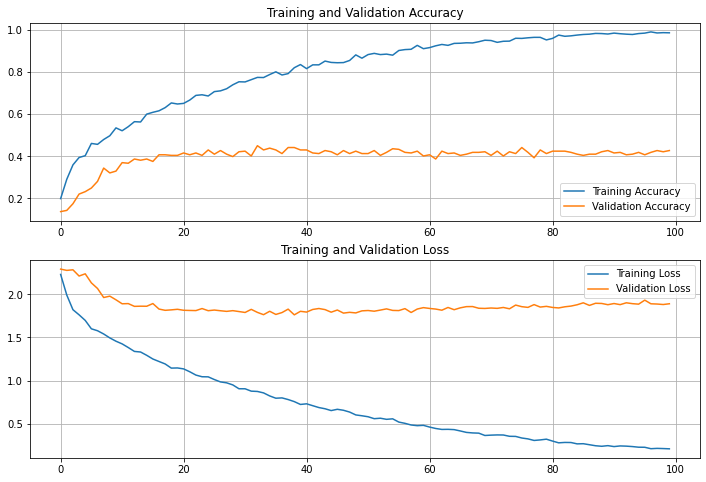

In [ ]:
plot_learning_curves_from_history(history_best_model_tuned)

Notre modèle optimisé est suprenamment beaucoup plus stable, mais s'il surajuste encore beaucoup.

A ce point, nous pensons qu'il faudrait surtout jouer sur l'**augmentation de données** pour tenter de réduire le surajustement, mais pour ce projet, nous allons plutôt essayer d'utiliser un modèle pré-entraîné que nous allons adapter à notre problème.

# Transfer Learning du modèle EfficientNet

**EfficientNet**, introduit pour la première fois en 2019 est l'un des modèles les plus efficaces (*c'est-à-dire nécessitant le moins de FLOPS pour l'inférence*) qui atteint une précision de pointe sur les tâches d'apprentissage de transfert d'images et de classification d'images courantes.

## Chargement du modèle et des données

L'implémentation du modèle dans **Keras** vient selon différentes configurations en fonction de la résolution des images en entrée.
Dans la continuation de notre travail sur l'optimisation des paramètres, nous allons choisir la configuration travaillant sur la taille d'image la plus proche de notre taille d'image optimale (ici **528**).

In [ ]:
from tensorflow.keras.applications import EfficientNetB6

In [ ]:
import tensorflow_datasets as tfds

batch_size = 32

dataset_name = "stanford_dogs"
(ds_train, ds_test), ds_info = tfds.load(
    dataset_name, split=["train", "test"], with_info=True, as_supervised=True
)
NUM_CLASSES = ds_info.features["label"].num_classes

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/stanford_dogs/0.2.0.incompleteUTXYYO/stanford_dogs-train.tfrecord*...:   0…

Generating test examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/stanford_dogs/0.2.0.incompleteUTXYYO/stanford_dogs-test.tfrecord*...:   0%…

Dataset stanford_dogs downloaded and prepared to /root/tensorflow_datasets/stanford_dogs/0.2.0. Subsequent calls will reuse this data.


In [ ]:


size = (IMG_SIZE, IMG_SIZE)
ds_train = ds_train.map(lambda image, label: (tf.image.resize(image, size), label))
ds_test = ds_test.map(lambda image, label: (tf.image.resize(image, size), label))

Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


## Augmentation de données

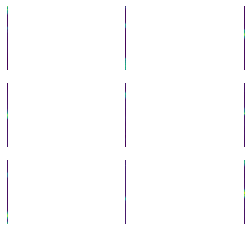

In [ ]:
img_augmentation = Sequential(
    [
        layers.RandomRotation(factor=0.15),
        layers.RandomTranslation(height_factor=0.1, width_factor=0.1),
        layers.RandomFlip(),
        layers.RandomContrast(factor=0.1),
    ],
    name="img_augmentation",
)

for image, label in ds_train.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        aug_img = img_augmentation(tf.expand_dims(image, axis=0))
        plt.imshow(aug_img[0].numpy().astype("uint8"))
        plt.axis("off")

## Préparation des données

In [ ]:
def input_preprocess(image, label):
    label = tf.one_hot(label, NUM_CLASSES)
    return image, label


ds_train = ds_train.map(
    input_preprocess, num_parallel_calls=tf.data.AUTOTUNE
)
ds_train = ds_train.batch(batch_size=batch_size, drop_remainder=True)
ds_train = ds_train.prefetch(tf.data.AUTOTUNE)

ds_test = ds_test.map(input_preprocess)
ds_test = ds_test.batch(batch_size=batch_size, drop_remainder=True)


## Apprentissage

In [ ]:
inputs = layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3))
x = img_augmentation(inputs)
outputs = EfficientNetB6(include_top=True, weights=None, classes=NUM_CLASSES)(x)

model = tf.keras.Model(inputs, outputs)
model.compile(
    optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"]
)

model.summary()

epochs = 40  # @param {type: "slider", min:10, max:100}
hist = model.fit(ds_train, epochs=epochs, validation_data=ds_test, verbose=2)


# Xception

In [16]:
keras.backend.clear_session()
tf.random.set_seed(SEED)
np.random.seed(SEED)

from tensorflow.keras.applications.xception import Xception, preprocess_input

In [ ]:
Xception_model = Xception(include_top=False,
                  input_shape = (500,500,3),
                  weights = 'imagenet')

for layer in Xception_model.layers:
    layer.trainable = False

model = keras.Sequential([
    keras.layers.Lambda(preprocess_input),
    Xception_model,
    keras.layers.BatchNormalization(),
    keras.layers.GlobalAveragePooling2D(),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(1024, activation='relu'),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(num_classes)
])

In [ ]:
model.compile(loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              optimizer='adagrad', 
              metrics=["accuracy"])

In [ ]:
epochs = 10

history_xception = model.fit(train_ds,
                             epochs=epochs,
                             validation_data=val_ds,
                             batch_size=batch_size
)

Epoch 1/10
44/44 [==============================] - 42s 878ms/step - loss: 2.0820 - accuracy: 0.2622 - val_loss: 2.0237 - val_accuracy: 0.8424
Epoch 2/10
44/44 [==============================] - 37s 849ms/step - loss: 1.4276 - accuracy: 0.6411 - val_loss: 1.7153 - val_accuracy: 0.9599
Epoch 3/10
44/44 [==============================] - 37s 855ms/step - loss: 0.9926 - accuracy: 0.8446 - val_loss: 1.3974 - val_accuracy: 0.9857
Epoch 4/10
44/44 [==============================] - 37s 856ms/step - loss: 0.7463 - accuracy: 0.9205 - val_loss: 1.0859 - val_accuracy: 0.9943
Epoch 5/10
44/44 [==============================] - 37s 852ms/step - loss: 0.5575 - accuracy: 0.9527 - val_loss: 0.8116 - val_accuracy: 0.9971
Epoch 6/10
44/44 [==============================] - 37s 848ms/step - loss: 0.4660 - accuracy: 0.9678 - val_loss: 0.5863 - val_accuracy: 0.9971
Epoch 7/10
44/44 [==============================] - 37s 855ms/step - loss: 0.3873 - accuracy: 0.9721 - val_loss: 0.4180 - val_accuracy: 0.9971

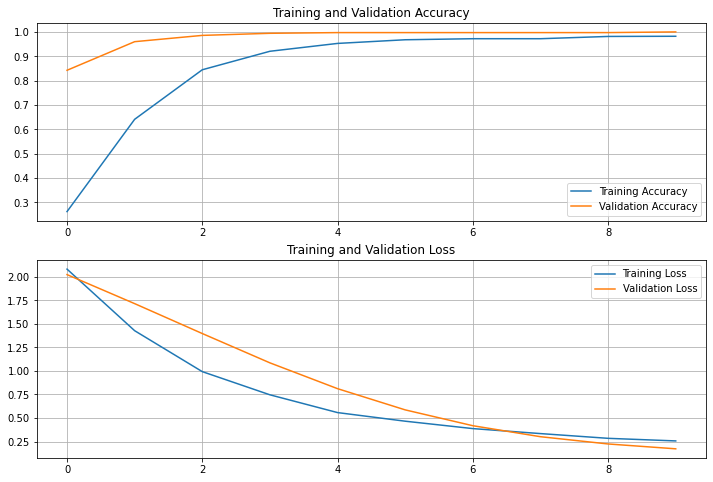

In [ ]:
plot_learning_curves_from_history(history_xception)

Les résultats sont sans équivoque...

## Explicabilité du modèle

Maintenant que nous avons un modèle très performant, nous allons confronter sa compréhension du sujet en observant les caractéristiques des images qu'il considère discriminantes pour prendre une décision.

Pour cela, nous allons utiliser la librairie **LIME**.

Ainsi, nous pourrons savoir si le modèle base ses décisions sur des éléments pertinents au regard du sujet ou non.

In [13]:
from tensorflow.keras.preprocessing import image

In [14]:
def get_model_predictions(model, image):
    if len(image.shape)==4:
      prediction = class_names[np.argmax(model.predict(image))]
    else:
      prediction = class_names[np.argmax(model.predict(tf.expand_dims(image, axis=0)))]
    print(f"La race du chien est : {prediction}")
    return prediction

In [ ]:
def explainer_lime(model, image_to_exp, breed):
  """

    Objectif : 
      Mettre en valeur les zones discriminantes d'une image pour le modèle

    Arguments:
      model : modèle entraîné
      img_instance : image du jeu de données

    Valeur retournée:
      None : affiche 2 graphiques, le premier l'image passée en argument, le second la même image avec les zones discriminantes en surbrillance

  """
  explainer = lime_image.LimeImageExplainer()
  img_instance = image.img_to_array(image_to_exp)
  explained = explainer.explain_instance(img_instance, model.predict, num_samples=1000, random_seed=SEED)
  fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10,5))
  fig.suptitle(f"Mise en surbrillance des zones discriminantes pour le modèle. Race : {class_names[breed]}", fontsize=15)
  ax[0].imshow(img_instance)
  temp, mask = explained.get_image_and_mask(explained.top_labels[0], positive_only=False, hide_rest=False)
  ax[1].imshow(segmentation.mark_boundaries(temp/2+0.5, mask))
  plt.show()

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 38ms/step


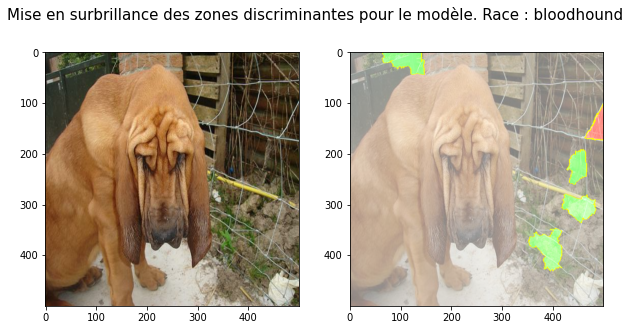

None

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 42ms/step


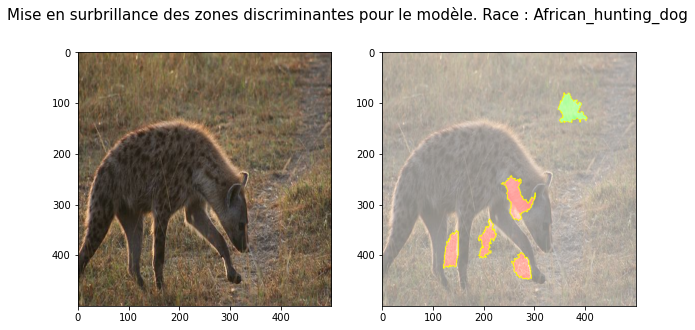

None

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 38ms/step


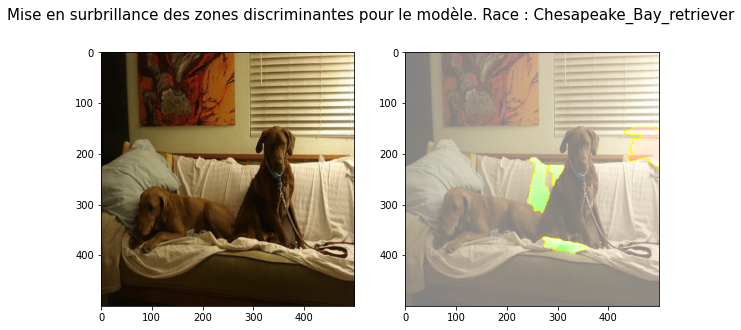

None

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 40ms/step


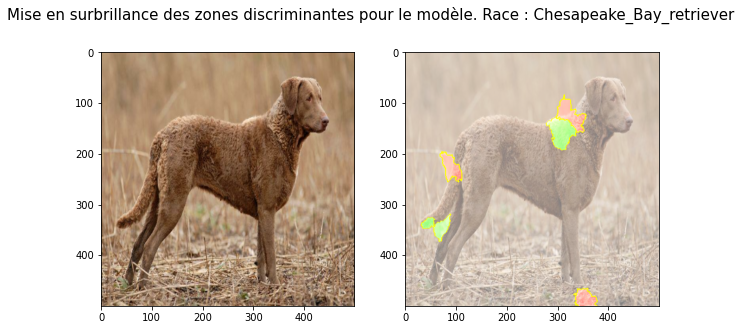

None

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 38ms/step


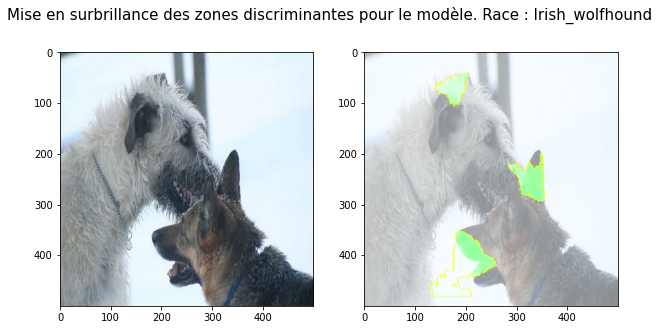

None

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 38ms/step


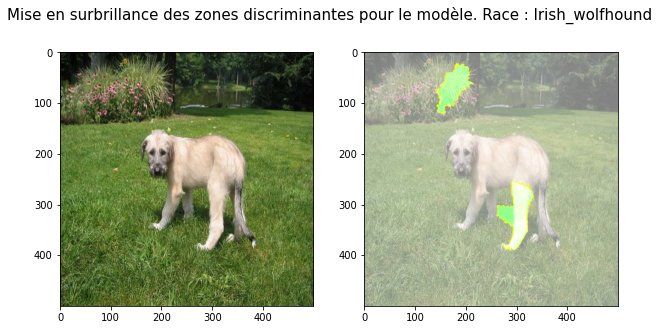

None

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 38ms/step


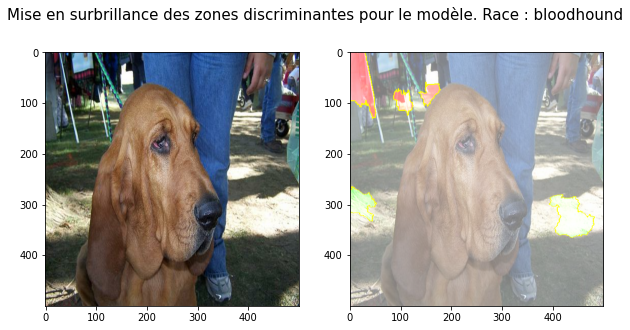

None

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 40ms/step


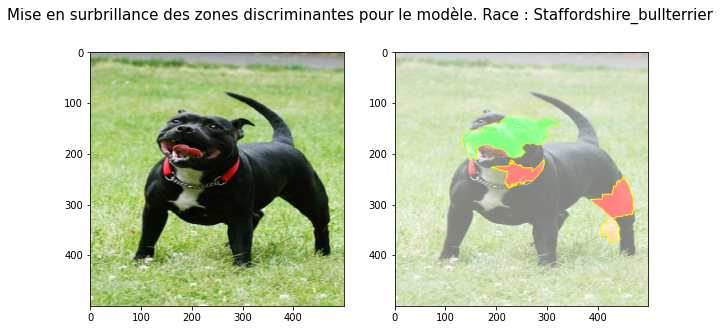

None

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 42ms/step


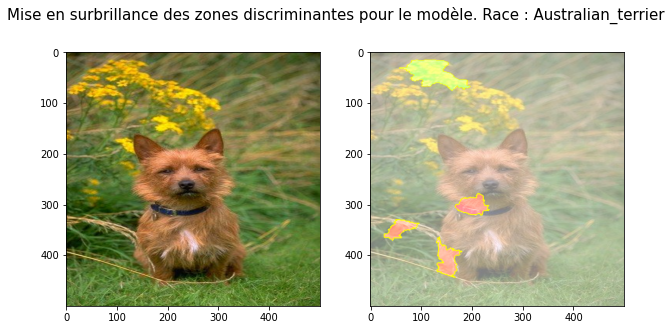

None

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 41ms/step


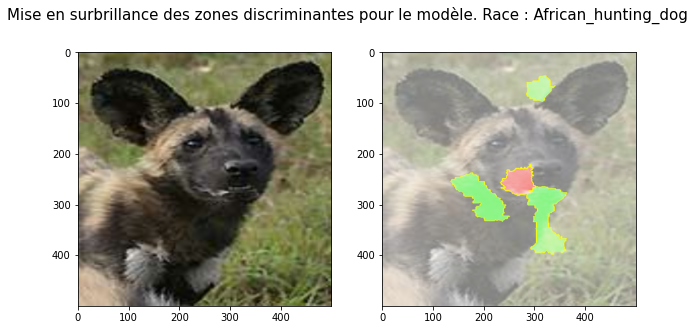

None

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 39ms/step


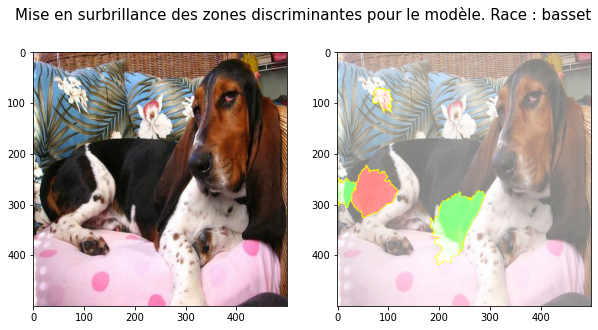

None

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 38ms/step


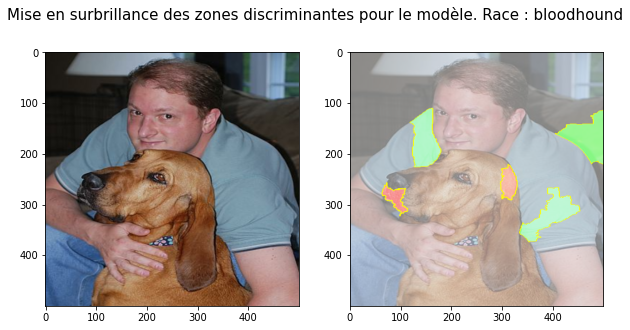

None

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 54ms/step


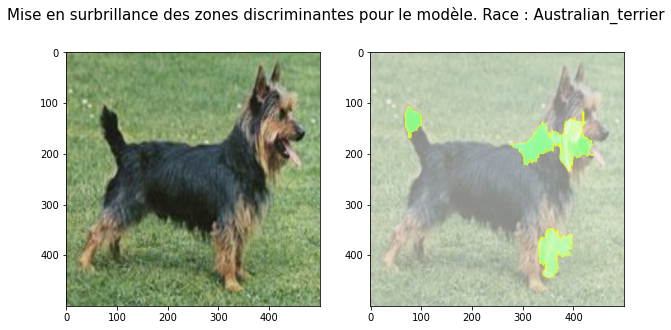

None

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 43ms/step


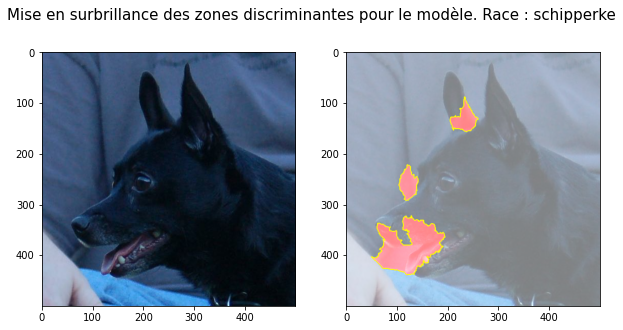

None

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 39ms/step


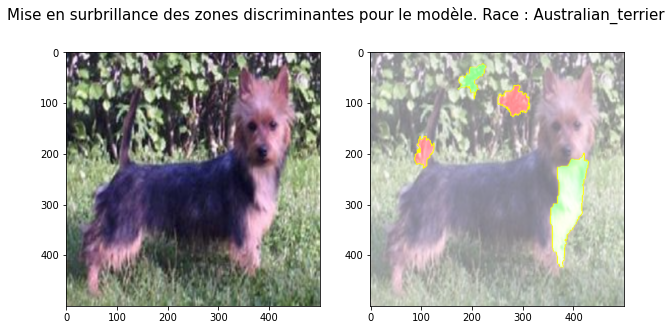

None

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 39ms/step


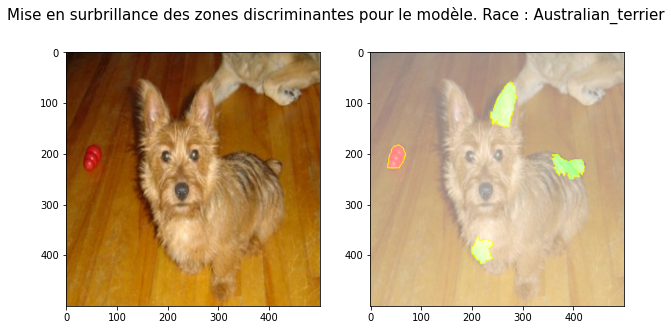

None

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 42ms/step


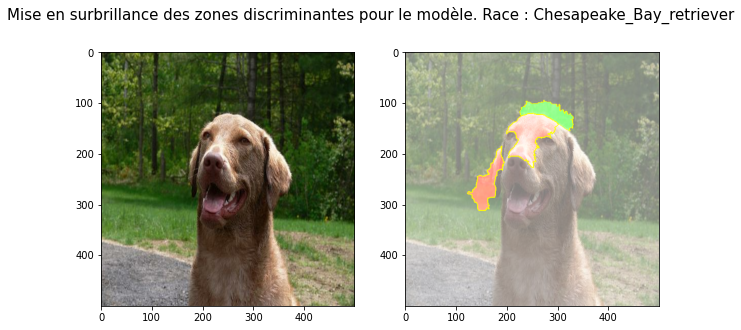

None

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 51ms/step


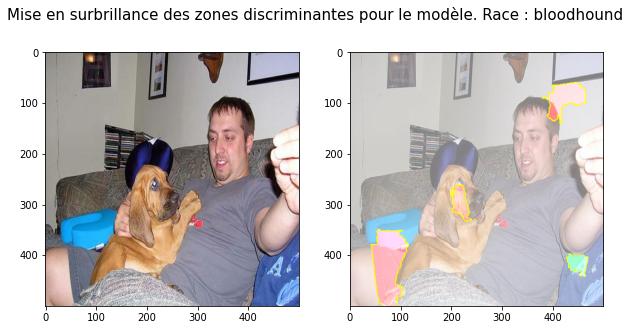

None

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 39ms/step


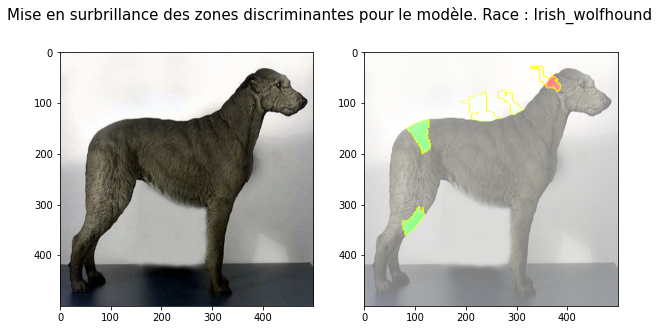

None

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 39ms/step


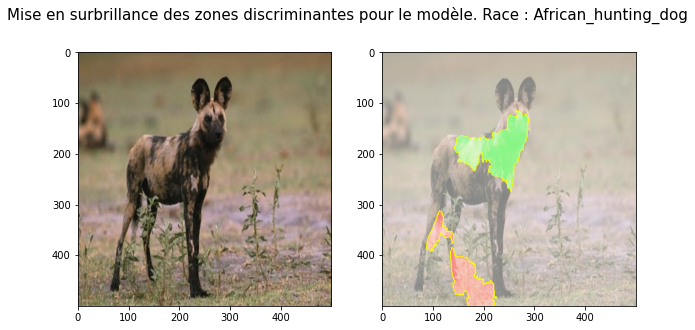

None

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 44ms/step


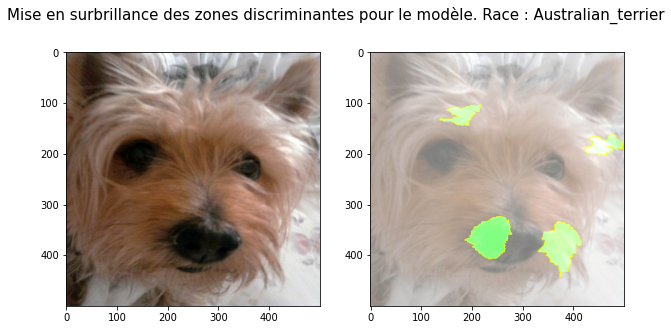

None

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 40ms/step


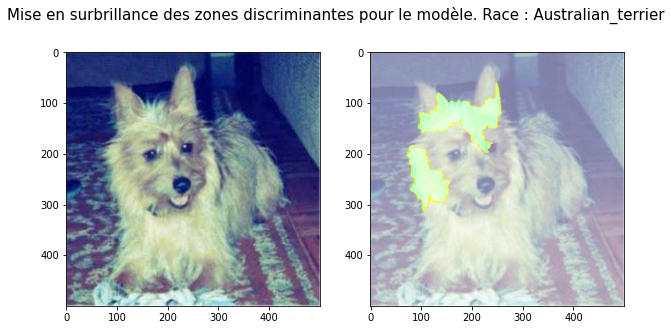

None

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 47ms/step


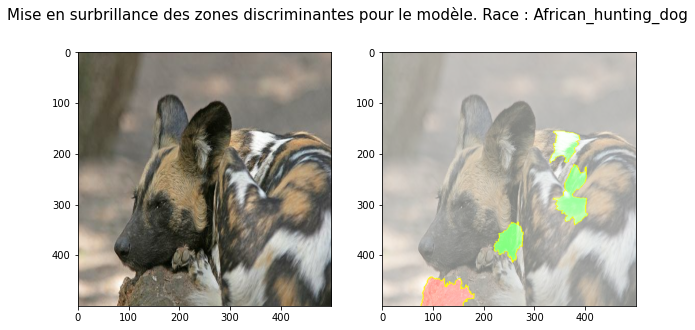

None

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 41ms/step


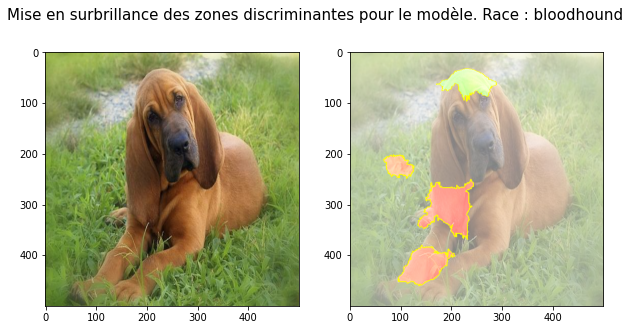

None

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 43ms/step


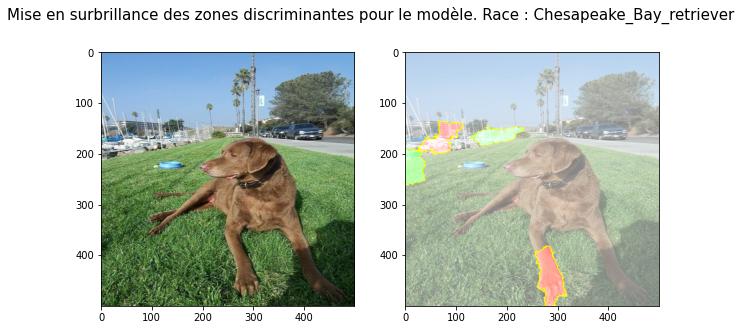

None

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 40ms/step


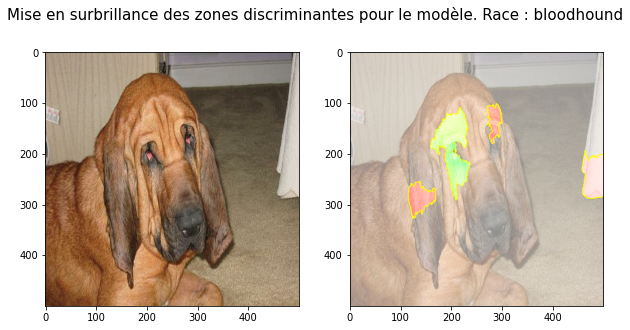

None

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 49ms/step


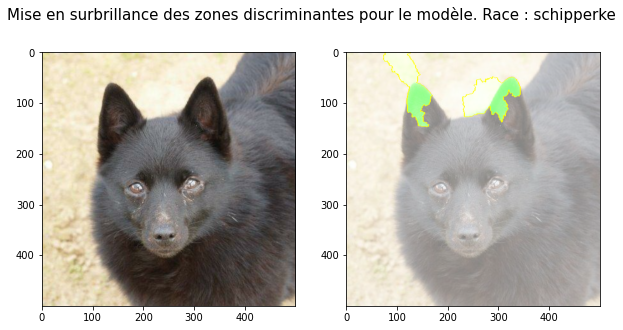

None

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 38ms/step


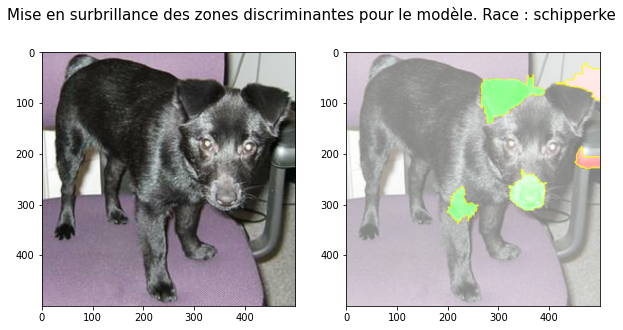

None

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 49ms/step


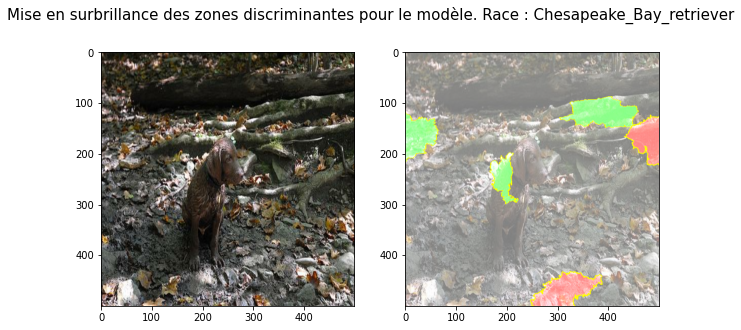

None

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 43ms/step


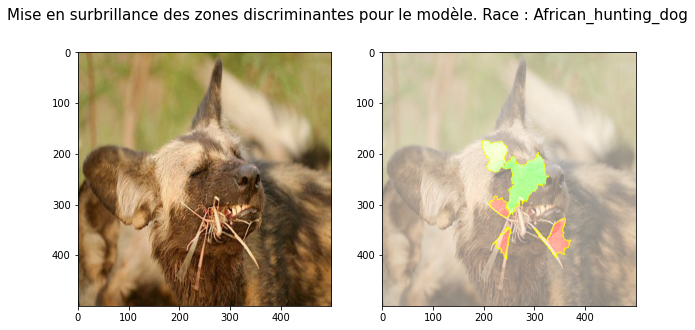

None

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 40ms/step


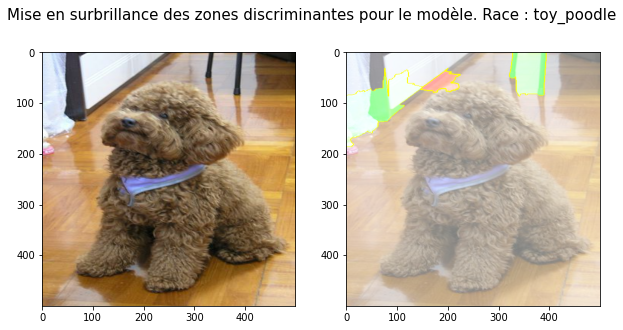

None

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 39ms/step


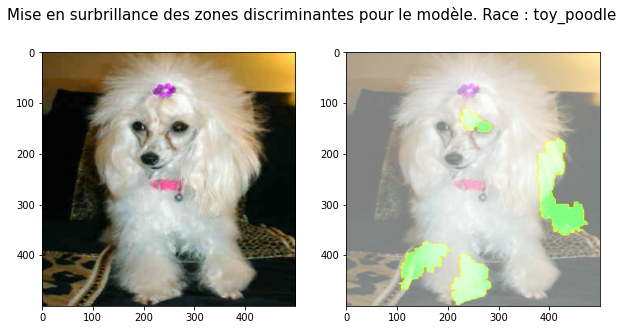

None

In [ ]:
for batch, batch_labels in train_ds.take(np.random.randint(len(train_ds))):
  for image_example, breed in zip(batch, batch_labels):
    display(explainer_lime(model, image_example/255, breed))
  break

# Enregistrement des éléments pour créer la fonction de prédiction

In [ ]:
save_pickle(class_names, "class_names")

Fichier enregistré sous le nom 'class_names' 


In [ ]:
model.save("results/model_saved/xception_based_model.h5")

# Tests pour l'application

In [ ]:
list(batch_label.numpy())

[7,
 1,
 1,
 9,
 9,
 0,
 4,
 2,
 3,
 2,
 6,
 2,
 7,
 4,
 6,
 8,
 5,
 3,
 0,
 0,
 6,
 1,
 9,
 0,
 1,
 5,
 0,
 7,
 9,
 5,
 0,
 4]

In [8]:
reconstructed_model = keras.models.load_model("results/model_saved/xception_based_model.h5")

In [22]:
load_pickle("class_names")

Variable créée sous le nom 'class_names' 


In [26]:
load_pickle("batch_image")

Variable créée sous le nom 'batch_image' 


In [27]:
load_pickle('batch_label')

Variable créée sous le nom 'batch_label' 


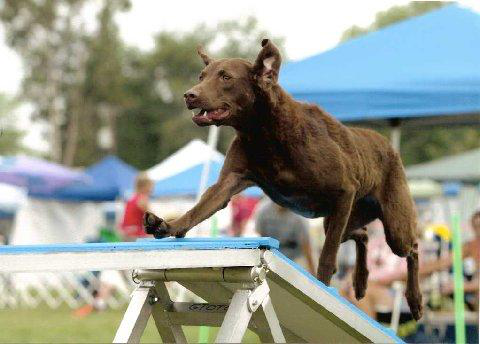

In [18]:
img = PIL.Image.open("datas/10_breeds/Chesapeake_Bay_retriever/n02099849_3.jpg")
img

In [ ]:
img_into_array = image.img_to_array(img)

In [ ]:
img_into_array.shape

(375, 500, 3)

In [32]:
def prepare_image(img):
    """ transform into array and preprocess image """
    img = img.resize((500,500))
    img_tensor = image.img_to_array(img)
    img_tensor = np.expand_dims(img_tensor, axis=0)
    return img_tensor

In [33]:
img_ready = prepare_image(img)

In [24]:
img_ready.shape

(1, 500, 500, 3)

In [34]:
prediction = get_model_predictions(reconstructed_model, img_ready)

1/1 [==============================] - 0s 26ms/step
La race du chien est : Chesapeake_Bay_retriever


In [30]:
batch_image[0].shape

TensorShape([500, 500, 3])

In [31]:
get_model_predictions(reconstructed_model, tf.expand_dims(batch_image[0], axis=0))

1/1 [==============================] - 0s 27ms/step
La race du chien est : bloodhound


'bloodhound'

In [29]:
class_names[batch_label[0]]

'bloodhound'

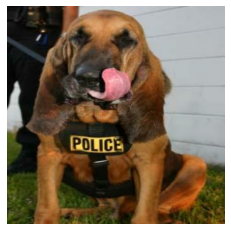

In [ ]:
plt.imshow(batch_image[0].numpy()/255)
plt.axis('off');